<a href="https://colab.research.google.com/github/ZaraJ2023/Concordia-INSE6220-F2023/blob/main/Zahra_Jafariasl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Import Python Modules**

In [57]:
import numpy as np
import pandas as pd
!pip install pycaret[analysis]

import matplotlib.pyplot as plt
# use seaborn plotting style defaults
import seaborn as sns
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = (12,8)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

from scipy.stats import beta
from scipy.stats import f

from itertools import cycle

# Machine Learning Modules
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

In [58]:
#Bioinformatics data analysis and visualization toolkit
#!pip install bioinfokit

In [59]:
#from bioinfokit.visuz import cluster

## **Upload File**

In [60]:
!pip install pycaret


In [61]:
# from google.colab import files
# uploaded = files.upload()

In [62]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv')
df.head(n=25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,0
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,0
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,0
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,0
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,0


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   class            900 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 56.4 KB


### **Classes**

In [64]:
y = df['class']
target = df['class'].to_numpy()
print("Number of duplicated rows is: ", df.duplicated().sum())

print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())


Number of duplicated rows is:  0
Number of rows with NaNs is:  0


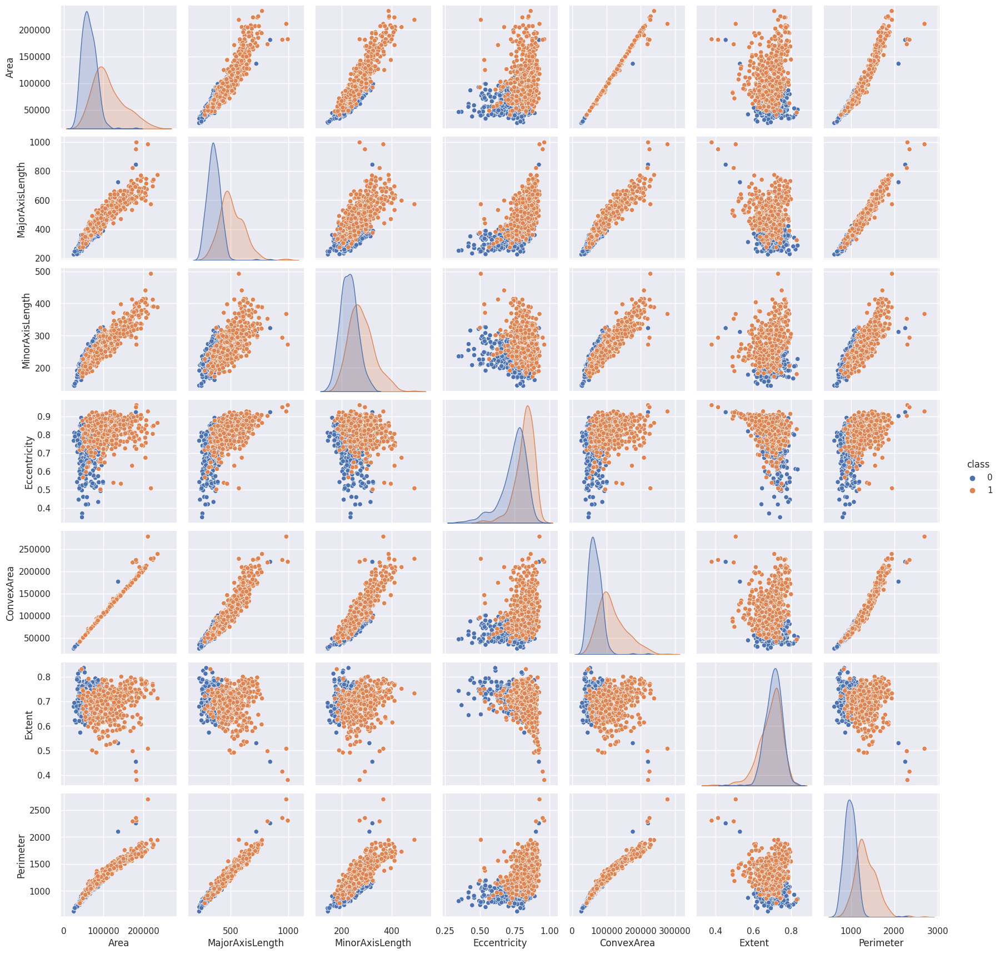

In [65]:
sns.pairplot(df, hue='class')
plt.show()

### **Features**

Data Matrix

In [66]:
X = df.iloc[:,0:7]
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544


In [67]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


Notice that the data is not standardizd. So we need to standarize it.

In [68]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,-0.007186,0.097577,-0.023958,0.423142,-0.015709,1.106743,0.066274
1,-0.324217,-0.209012,-0.229292,0.224476,-0.304248,-0.287777,-0.161252
2,0.078292,0.097758,0.236988,0.186239,0.062113,-1.158250,0.155945
3,-1.074286,-1.245051,-0.915273,-1.069623,-1.076165,0.001711,-1.175915
4,-0.215393,-0.678958,0.727354,-2.409827,-0.238623,1.745259,-0.338639
5,-0.989269,-0.972699,-1.088166,-0.046427,-0.977212,-0.768202,-1.038224
6,-1.162433,-1.041504,-1.568353,0.460367,-1.160393,-0.629029,-1.250349
7,-0.688862,-0.849133,-0.381463,-0.836226,-0.708208,0.825066,-0.849891
8,-1.168487,-0.929031,-1.639519,0.708518,-1.139802,-0.027639,-1.155572
9,-0.600920,-0.551563,-0.534746,0.027845,-0.615047,-0.657433,-0.673810


In [69]:
X_st = StandardScaler().fit_transform(X)
df = pd.DataFrame(X_st)
df.columns = X.columns

In [70]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,0.000000e+00,1.000556,-1.601242,-0.730010,-0.228374,0.441866,3.777353
MajorAxisLength,900.0,0.000000e+00,1.000556,-1.770279,-0.737144,-0.199413,0.545458,4.883667
MinorAxisLength,900.0,-6.315935e-17,1.000556,-2.217269,-0.708091,-0.132898,0.508404,4.759444
Eccentricity,900.0,0.000000e+00,1.000556,-4.794739,-0.440641,0.191694,0.676084,2.000508
ConvexArea,900.0,0.000000e+00,1.000556,-1.596379,-0.728228,-0.234009,0.421867,4.590095
Extent,900.0,1.578984e-17,1.000556,-5.981678,-0.535921,0.147067,0.664006,2.543983
Perimeter,900.0,0.000000e+00,1.000556,-1.998568,-0.729119,-0.169574,0.520748,5.598604


Notice that the data is now standardizd.

**Observations and variables**

In [71]:
observations = list(df.index)
print(observations)
variables = list(df.columns)
print(variables)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

## **Data Visualisation**

### Class Distribution

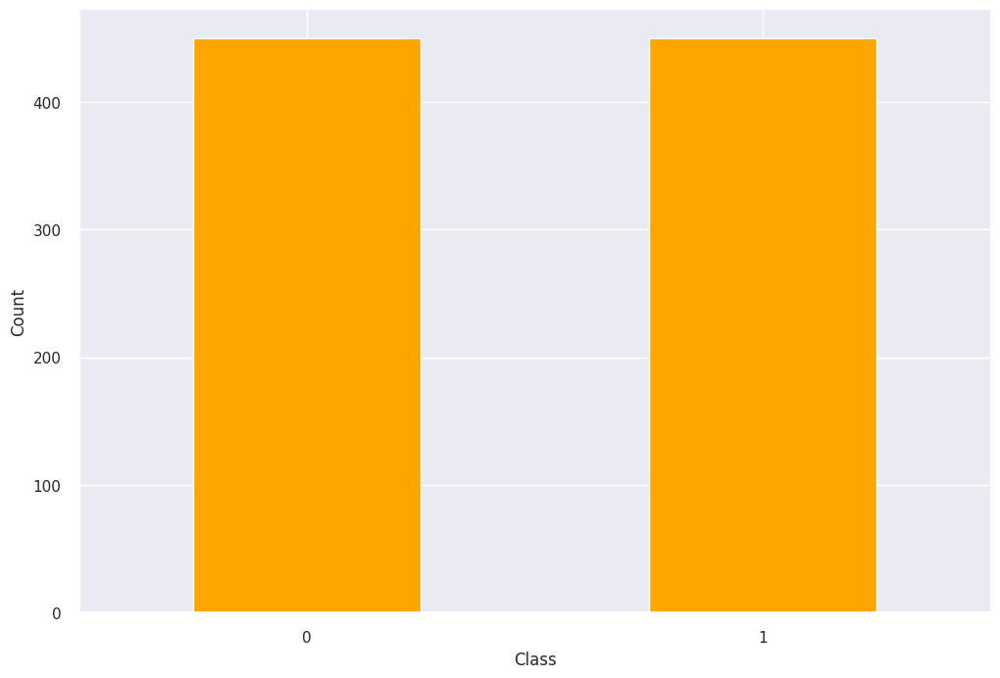

In [72]:
y.value_counts().plot(kind='bar', rot=0, color='orange')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

### Box & Whisker Plots

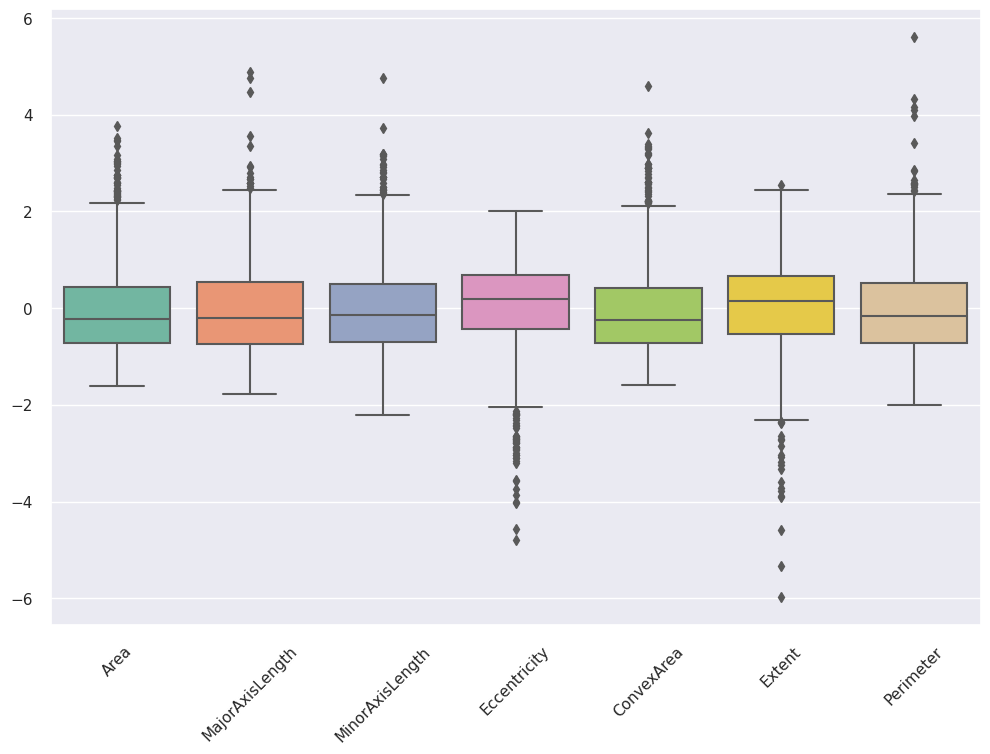

In [73]:
ax = plt.figure()
ax = sns.boxplot(data=df, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

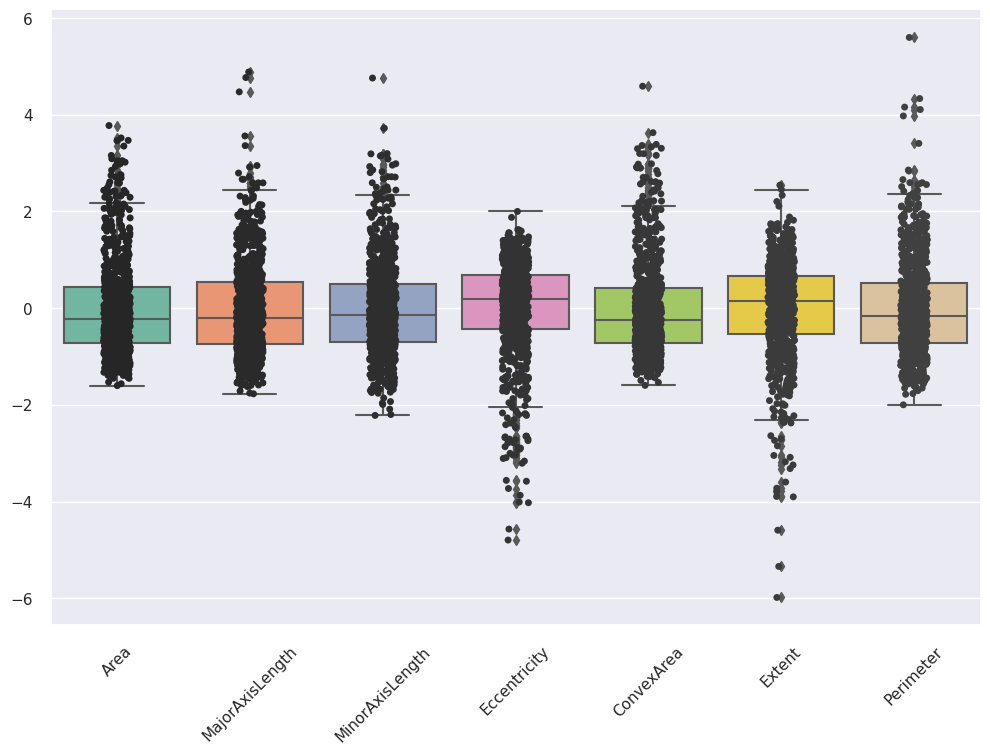

In [74]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()
ax = sns.boxplot(data=df, orient="v", palette="Set2")
ax = sns.stripplot(data=df, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

### Five Number Summary

In [75]:
df.describe()


,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
count,900.000000,900.000000,9.000000e+02,900.000000,900.000000,9.000000e+02,900.000000
mean,0.000000,0.000000,-6.315935e-17,0.000000,0.000000,1.578984e-17,0.000000
std,1.000556,1.000556,1.000556e+00,1.000556,1.000556,1.000556e+00,1.000556
min,-1.601242,-1.770279,-2.217269e+00,-4.794739,-1.596379,-5.981678e+00,-1.998568
25%,-0.730010,-0.737144,-7.080907e-01,-0.440641,-0.728228,-5.359214e-01,-0.729119
50%,-0.228374,-0.199413,-1.328978e-01,0.191694,-0.234009,1.470669e-01,-0.169574
75%,0.441866,0.545458,5.084041e-01,0.676084,0.421867,6.640063e-01,0.520748
max,3.777353,4.883667,4.759444e+00,2.000508,4.590095,2.543983e+00,5.598604


### Pair Plot

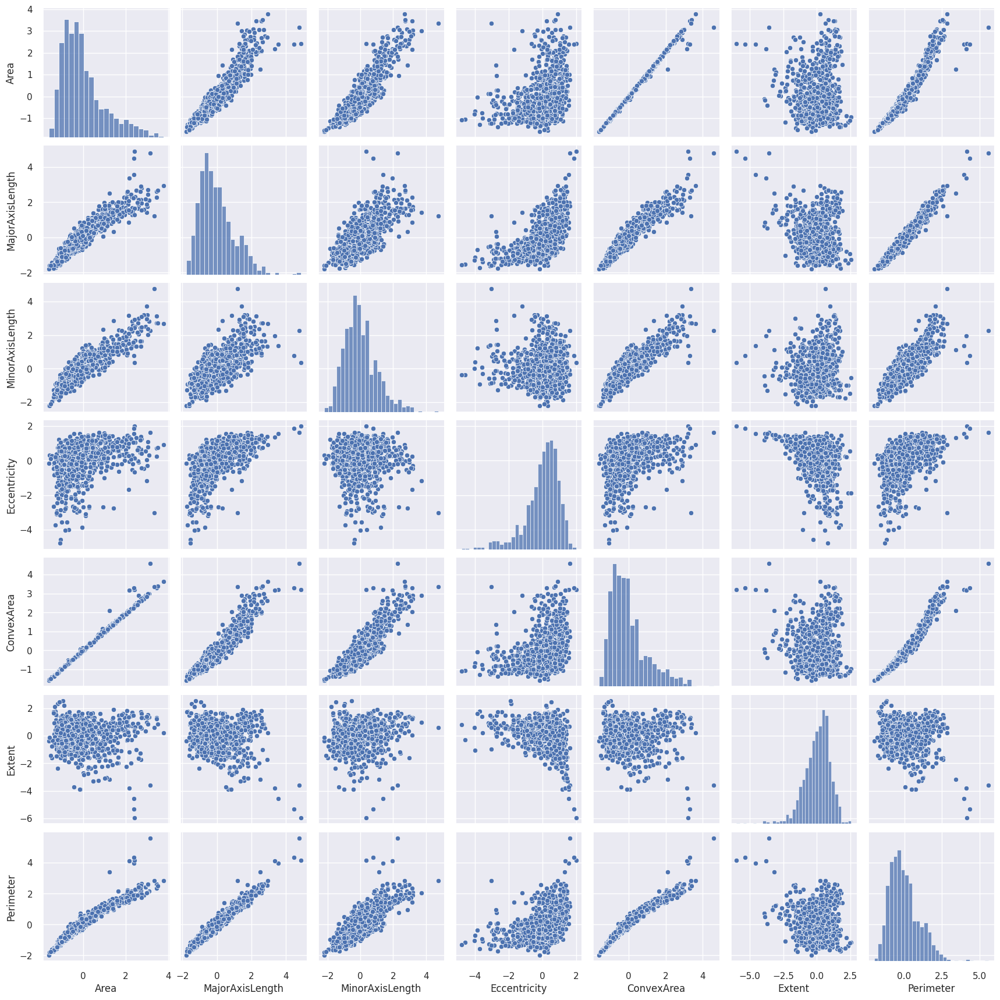

In [76]:
sns.pairplot(df)
plt.show()

## **Covariance**

Text(0.5, 1.0, 'Covariance matrix')

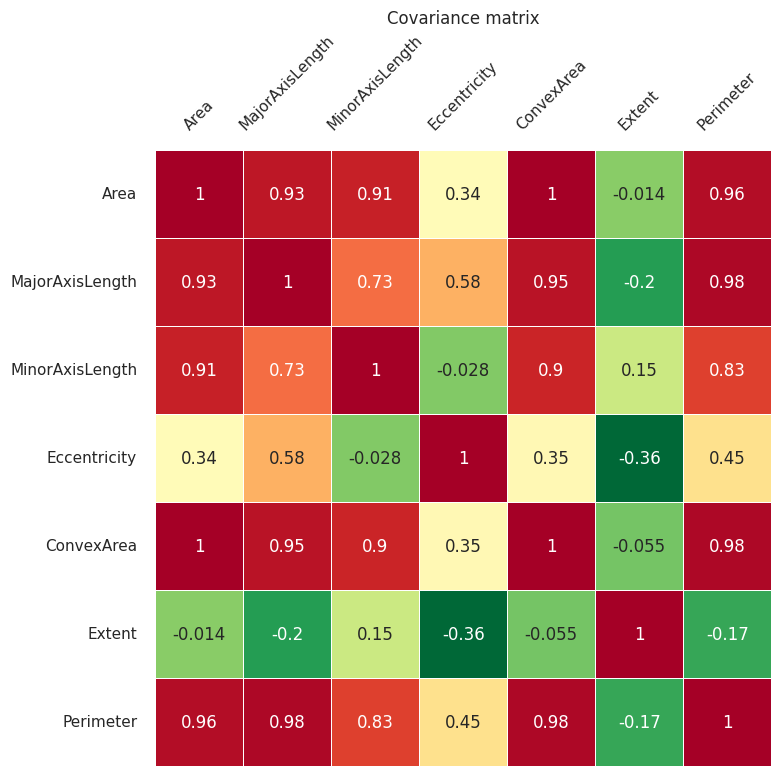

In [77]:
dfc = df - df.mean() #centered data
ax = sns.heatmap(dfc.cov(), cmap='RdYlGn_r', linewidths=0.5, annot=True,
            cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.title('Covariance matrix')

## **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

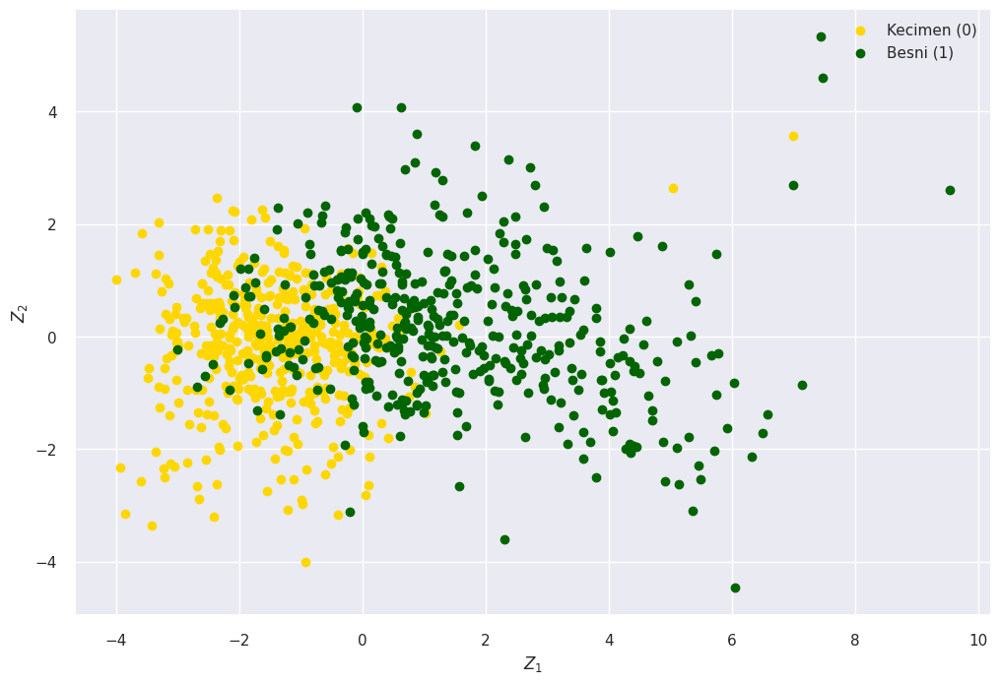

In [78]:
pca = PCA()
pca.fit(df)
Z = pca.fit_transform(df)

# 1(Kecimen)->0,  2(Besni)->1
idx_Kecimen = np.where(y == 0)
idx_Besni = np.where(y == 1)


plt. figure()
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='gold', label='Kecimen (0)')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='darkgreen', label='Besni (1)')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
#for label, x, y in zip(observations,Z[:, 0],Z[:, 1]):
#    plt.annotate(label, xy=(x, y), xytext=(-2, 2),
#        textcoords='offset points', ha='right', va='bottom')

### **Eigenvectors**

Eigenvector matrix:
[[ 0.44828422 -0.11609991  0.00548378 -0.11113906 -0.61104765 -0.09983439
  -0.62436686]
 [ 0.4432398   0.13658724 -0.10054797  0.49520464  0.08757032 -0.68557712
   0.22772863]
 [ 0.38938118 -0.37492246  0.23604354 -0.6558767   0.38457775 -0.2390332
   0.12995283]
 [ 0.20297098  0.61082321 -0.62852206 -0.42629865  0.07510412  0.05356014
   0.02044403]
 [ 0.45093833 -0.08761633  0.0366724   0.0558117  -0.39241075  0.47120104
   0.63914127]
 [-0.05636836 -0.66734439 -0.73198093  0.10905256  0.05685884  0.02345199
  -0.00161639]
 [ 0.45082374  0.03417227  0.04430077  0.3398651   0.5551508   0.48726906
  -0.36399975]]


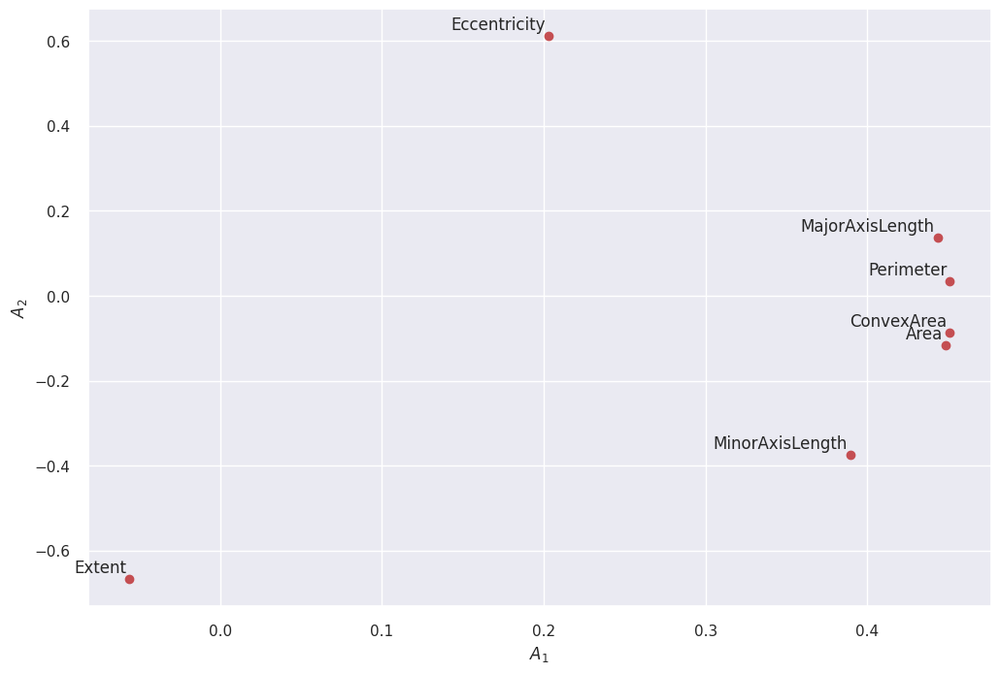

In [79]:
A = pca.components_.T
print(f'Eigenvector matrix:\n{A}')

plt.figure()
plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

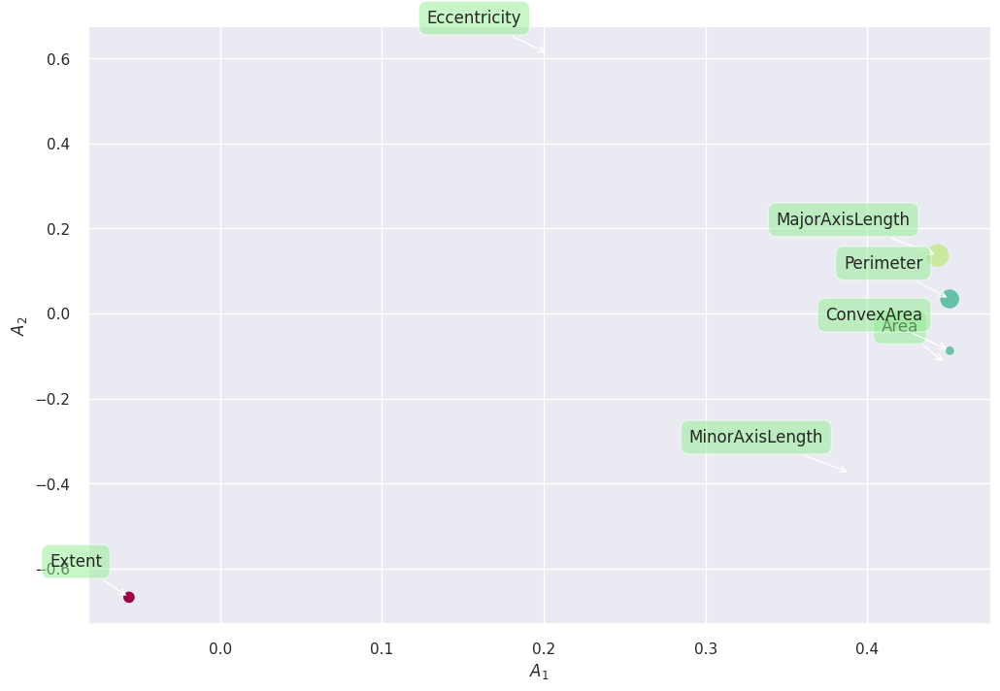

In [80]:
plt.figure()
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='lightgreen', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

### **Scree plot**

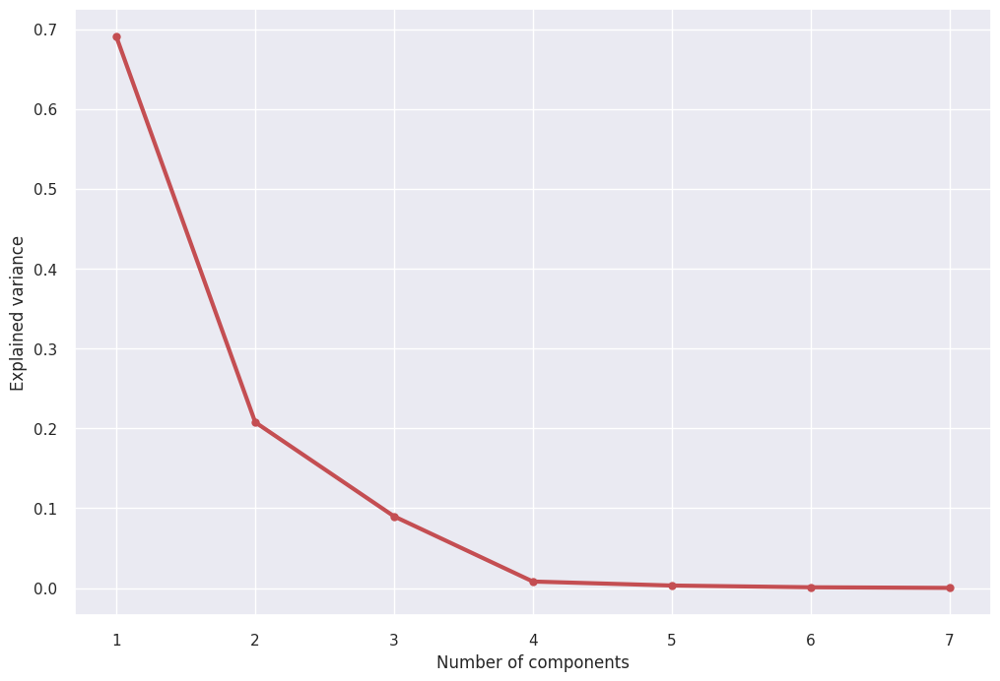

In [81]:
#Eigenvalues
Lambda = pca.explained_variance_
#print(f'Eigenvalues:\n{Lambda}')

#Scree plot
plt. figure()
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()


### **Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

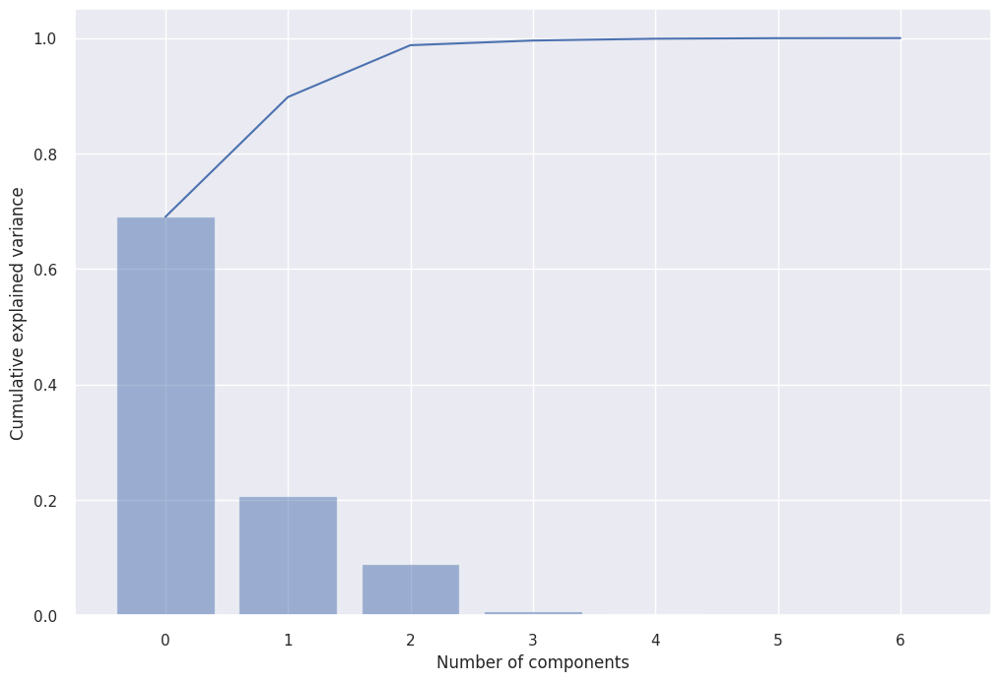

In [82]:
ell = pca.explained_variance_ratio_
plt.figure()
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Explained Variance per PC**

In [83]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}
PC_variance

{'0': 'PC 1 (69.0%)',
 '1': 'PC 2 (20.8%)',
 '2': 'PC 3 (9.0%)',
 '3': 'PC 4 (0.8%)',
 '4': 'PC 5 (0.3%)',
 '5': 'PC 6 (0.1%)',
 '6': 'PC 7 (0.0%)'}

### **Biplot**

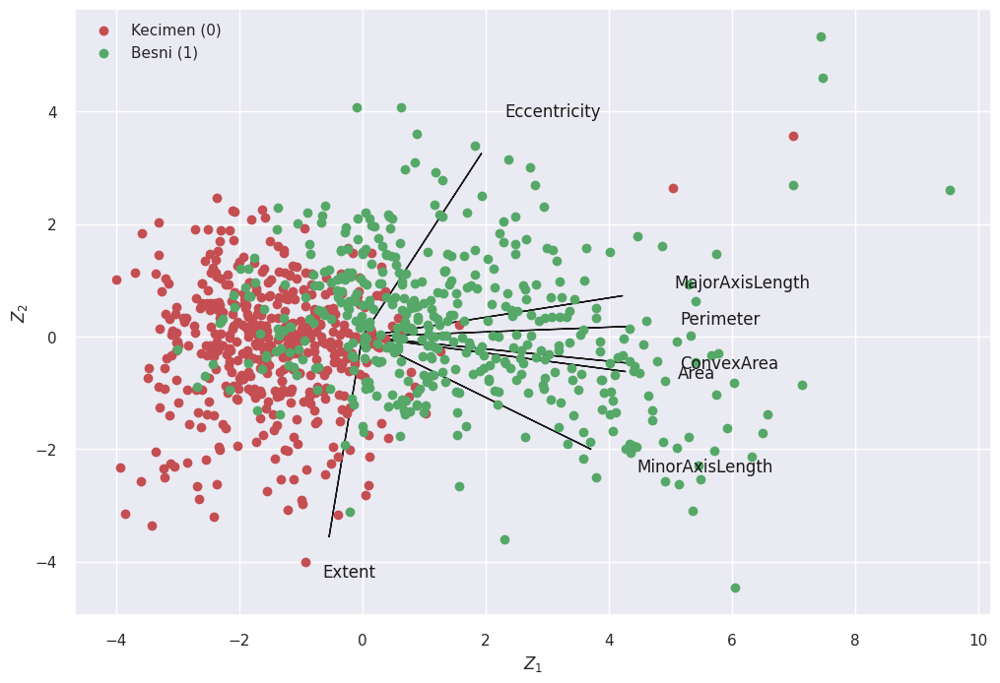

In [84]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='r', label='Kecimen (0)')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='g', label='Besni (1)')
plt.legend(loc='upper left')
#for i in range(len(Z1)):
# circles project documents (ie rows from csv) as points onto PC axes
  #plt.scatter(Z1[i], Z2[i], c='g', marker='o')
  #plt.text(Z1[i]*1.2, Z2[i]*1.2, observations[i], color='b')

In [85]:
# cluster.biplot(cscore=Z, loadings=A, labels=X.columns.values, var1=round(pca.explained_variance_ratio_[0]*100, 2),
               # var2=round(pca.explained_variance_ratio_[1]*100, 2), colorlist=target)

**Using PCA Librarry**

In [86]:
!pip install pca

In [87]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [88]:
out['PC']

,PC1,PC2,PC3
0,0.076994,-0.453328,-1.089214
1,-0.475376,0.445368,0.016372
2,0.372109,0.802008,0.786487
3,-2.622445,-0.302564,0.482721
4,-0.962054,-2.967763,0.452154
...,...,...,...
895,-0.114629,0.694645,0.129914
896,0.273577,0.953934,0.696489
897,0.682451,-1.308199,0.091732
898,0.648410,0.979248,0.091413


In [89]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [90]:
 # Print the top features. The results show that f1 is best, followed by f2 etc
print(out['topfeat'])

    PC          feature   loading  type
0  PC1       ConvexArea  0.450938  best
1  PC2           Extent -0.667344  best
2  PC3           Extent -0.731981  best
3  PC1             Area  0.448284  weak
4  PC1  MajorAxisLength  0.443240  weak
5  PC1  MinorAxisLength  0.389381  weak
6  PC3     Eccentricity -0.628522  weak
7  PC1        Perimeter  0.450824  weak


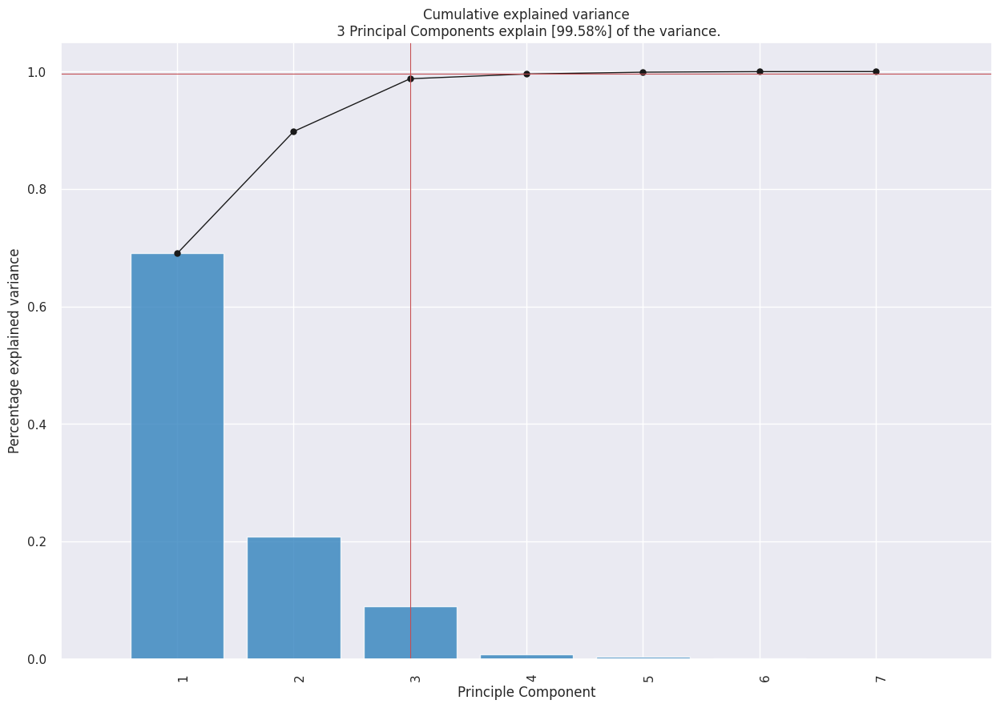

In [91]:
model.plot();

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.58%] of the variance'}, xlabel='PC1 (69.0% expl.var)', ylabel='PC2 (20.7% expl.var)'>)

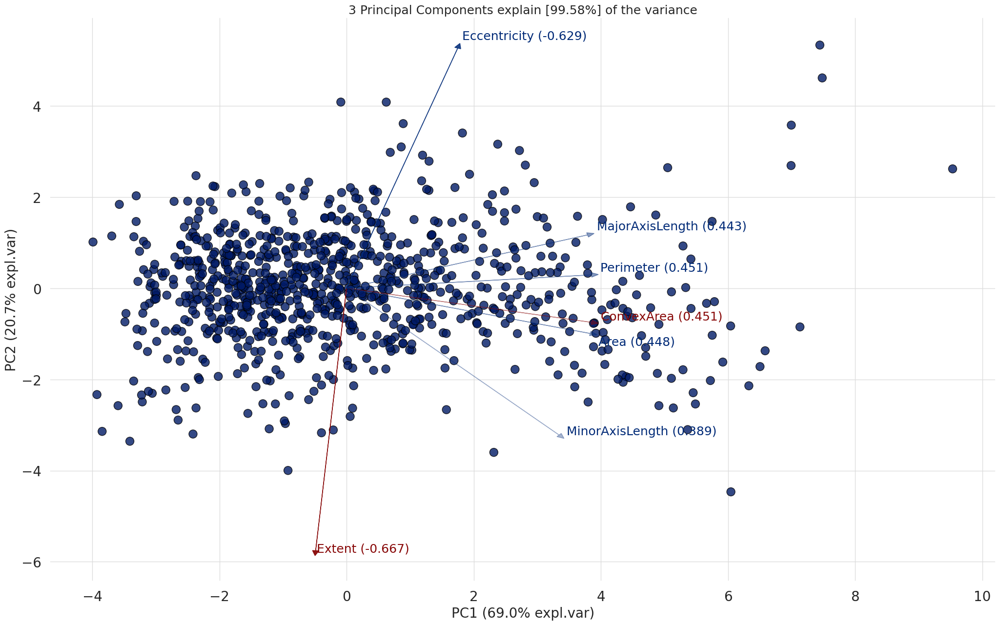

In [92]:
model.biplot(label=False, legend=False)

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.58%] of the variance'}, xlabel='PC1 (69.0% expl.var)', ylabel='PC2 (20.7% expl.var)'>)

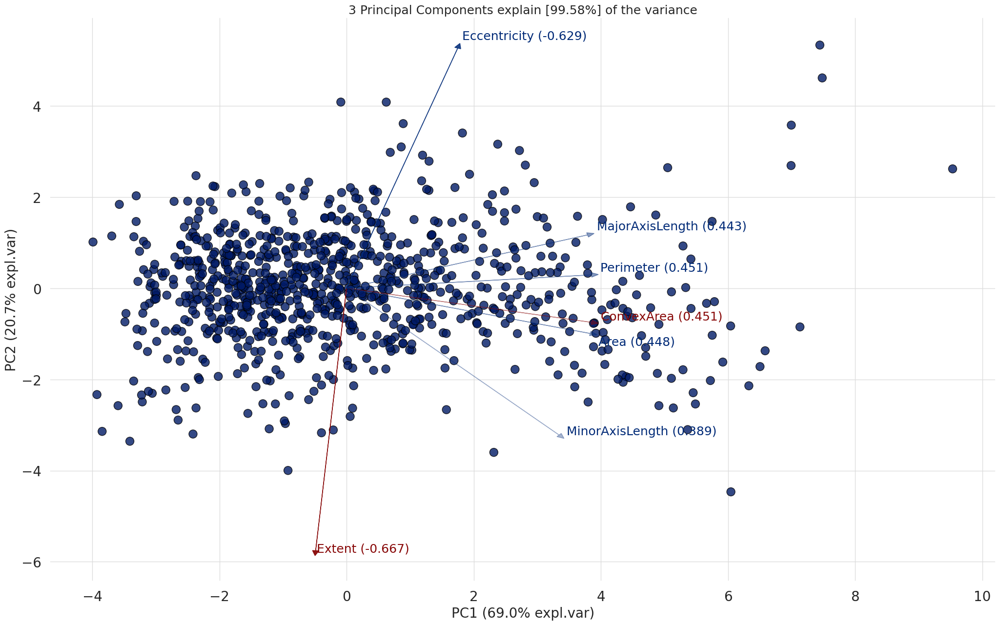

In [93]:
model.biplot(cmap='RdYlGn_r', label=False, legend=False)

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.58%] of the variance'}, xlabel='PC1 (69.0% expl.var)', ylabel='PC2 (20.7% expl.var)'>)

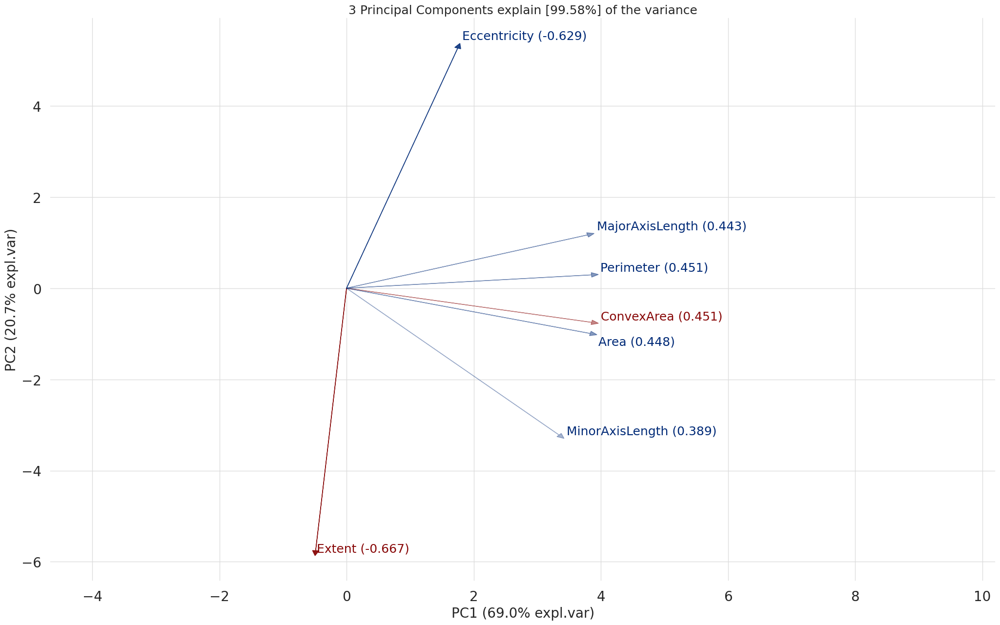

In [94]:
model.biplot(cmap=None, label=False, legend=False)

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3D: title={'center': '3 Principal Components explain [99.58%] of the variance'}, xlabel='PC1 (69.0% expl.var)', ylabel='PC2 (20.7% expl.var)', zlabel='PC3 (8.97% expl.var)'>)

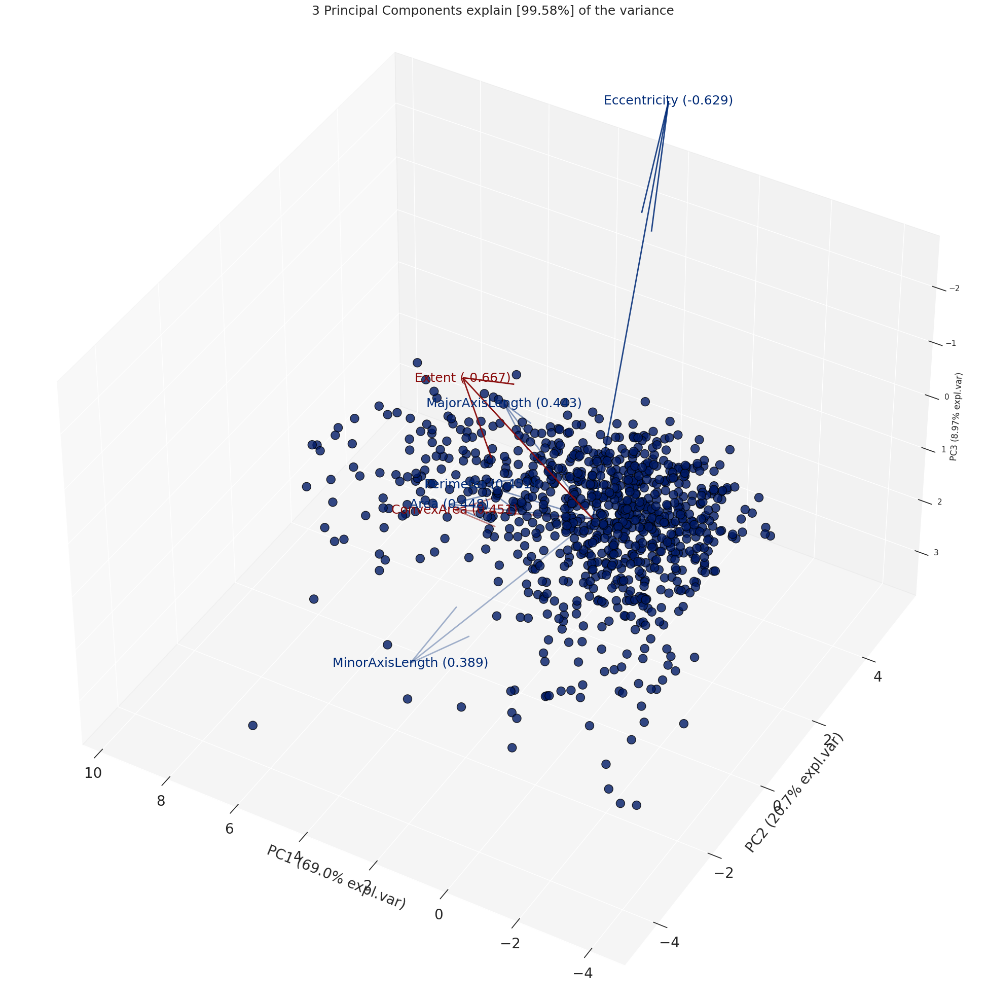

In [95]:
model.biplot3d(legend=False)

### **Principal components**

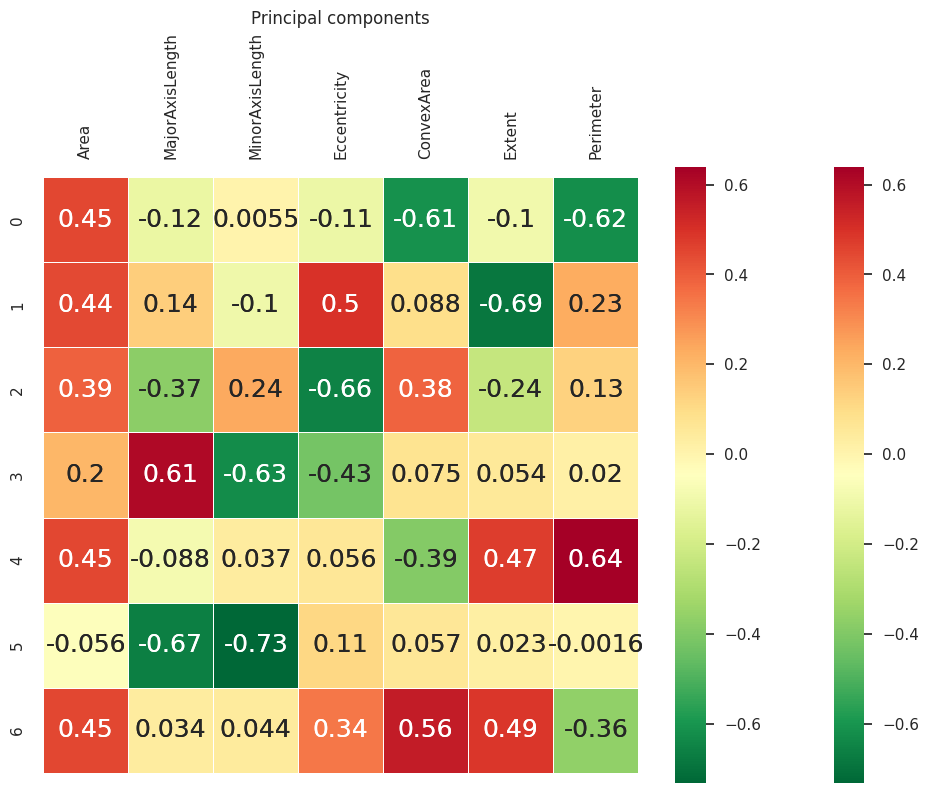

PC1:[ 0.44828422  0.4432398   0.38938118  0.20297098  0.45093833 -0.05636836
  0.45082374]
PC2:[-0.11609991  0.13658724 -0.37492246  0.61082321 -0.08761633 -0.66734439
  0.03417227]


In [96]:
comps = pd.DataFrame(A, columns = variables)
sns.heatmap(comps,cmap='RdYlGn_r', linewidths=0.5, annot=True,
            cbar=True, square=True)
ax = sns.heatmap(comps, cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=True, square=True)
ax.tick_params(labelbottom=False,labeltop=True)
plt.xticks(rotation=90)
plt.title('Principal components')
plt.show()

print(f'PC1:{A1}')
print(f'PC2:{A2}')


### **Hotelling's T2 test**

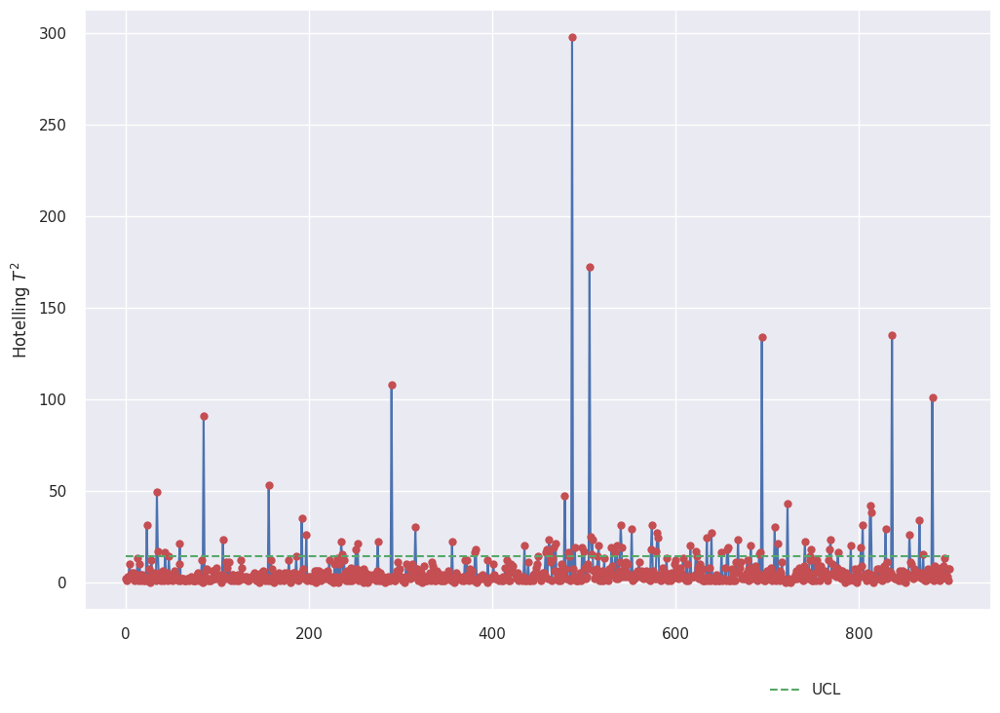

In [97]:
alpha = 0.05
p=Z.shape[1]
n=Z.shape[0]

UCL=((n-1)**2/n )*beta.ppf(1-alpha, p / 2 , (n-p-1)/ 2)
UCL2=p*(n+1)*(n-1)/(n*(n-p) )*f.ppf(1-alpha, p , n-p)
Tsquare=np.array([0]*Z.shape[0])
for i in range(Z.shape[0]):
  Tsquare[i] = np.matmul(np.matmul(np.transpose(Z[i]),np.diag(1/Lambda) ) , Z[i])

fig, ax = plt.subplots()
ax.plot(Tsquare,'-b', marker='o', mec='y',mfc='r' )
ax.plot([UCL for i in range(len(Z1))], "--g", label="UCL")
plt.ylabel('Hotelling $T^2$')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))

In [98]:
print(np.argwhere(Tsquare>UCL))

[[ 23]
 [ 34]
 [ 35]
 [ 43]
 [ 59]
 [ 85]
 [106]
 [156]
 [192]
 [197]
 [235]
 [236]
 [251]
 [253]
 [275]
 [290]
 [316]
 [356]
 [381]
 [382]
 [435]
 [458]
 [459]
 [461]
 [462]
 [467]
 [469]
 [479]
 [483]
 [487]
 [490]
 [498]
 [500]
 [506]
 [507]
 [508]
 [509]
 [516]
 [530]
 [534]
 [536]
 [540]
 [541]
 [552]
 [573]
 [574]
 [579]
 [580]
 [581]
 [616]
 [622]
 [634]
 [639]
 [650]
 [656]
 [657]
 [668]
 [682]
 [691]
 [692]
 [694]
 [708]
 [711]
 [722]
 [741]
 [748]
 [768]
 [769]
 [777]
 [791]
 [802]
 [804]
 [812]
 [813]
 [829]
 [836]
 [855]
 [866]
 [870]
 [880]]


### **Control Charts for Principal Components**

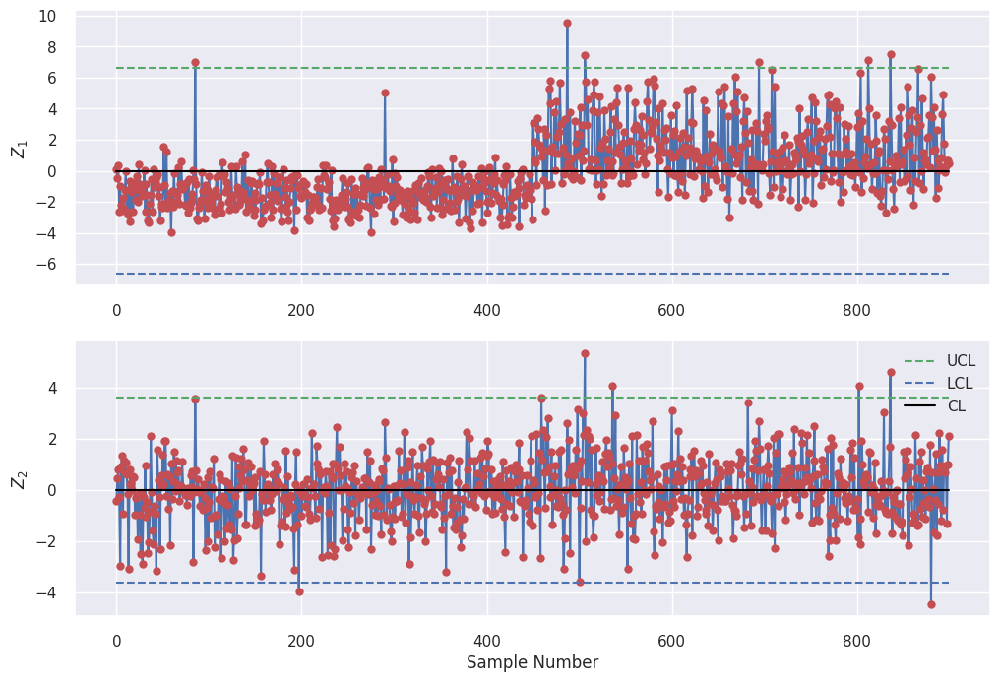

In [99]:
fig, (ax1, ax2) = plt.subplots(2,1)
ax1.plot(Z1,'-b', marker='o', mec='y',mfc='r')
ax1.plot([3*np.sqrt(Lambda[0]) for i in range(len(Z1))], "--g", label="UCL")
ax1.plot([-3*np.sqrt(Lambda[0]) for i in range(len(Z1))], "--b", label='LCL')
ax1.plot([0 for i in range(len(Z1))], "-", color='black',label='CL')
ax1.set_ylabel('$Z_1$')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))

ax2.plot(Z2,'-b', marker='o', mec='y',mfc='r')
ax2.plot([3*np.sqrt(Lambda[1]) for i in range(len(Z2))], "--g", label="UCL")
ax2.plot([-3*np.sqrt(Lambda[1]) for i in range(len(Z2))], "--b", label='LCL')
ax2.plot([0 for i in range(len(Z2))], "-", color='black',label='CL')
ax2.set_ylabel('$Z_2$')
ax2.set_xlabel('Sample Number')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))
plt.legend()

#### Out of Control Points

In [100]:
print(np.argwhere(Z1<-3*np.sqrt(Lambda[0])))
print(np.argwhere(Z1>3*np.sqrt(Lambda[0])))
print(np.argwhere(Z2<-3*np.sqrt(Lambda[1])))
print(np.argwhere(Z2>3*np.sqrt(Lambda[1])))

[]
[[ 85]
 [487]
 [506]
 [694]
 [812]
 [836]]
[[197]
 [880]]
[[506]
 [536]
 [802]
 [836]]


In [101]:
import pycaret
pycaret.__version__

'3.2.0'

In [102]:

data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (810, 7)
Unseen Data For Predictions: (90, 7)


In [103]:
!pip install pycaret



In [104]:
from pycaret.classification import setup


In [105]:
import pandas as pd
from pycaret.classification import setup

url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)
clf = setup(data=data, target='class', train_size=0.7, session_id=123)


,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 8)"
5,Transformed train set shape,"(630, 8)"
6,Transformed test set shape,"(270, 8)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


In [111]:
 !pip install --upgrade pycaret
from pycaret.classification import setup, compare_models
import pandas as pd
from pycaret.classification import setup, compare_models

url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Setup the classification environment
clf = setup(data=data, target='class', train_size=0.7, session_id=123)

# Compare different classification models
best_model = compare_models()

best_model = create_model('et')  # 'et' stands for Extra Trees, you can replace it with the desired algorithm code

 best_model = compare_models()

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 8)"
5,Transformed train set shape,"(630, 8)"
6,Transformed test set shape,"(270, 8)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.8667,0.9333,0.7811,0.9418,0.8521,0.7335,0.7456,0.0270
lr,Logistic Regression,0.8651,0.9328,0.8320,0.8901,0.8593,0.7302,0.7327,1.0360
lightgbm,Light Gradient Boosting Machine,0.8651,0.9288,0.8416,0.8829,0.8612,0.7303,0.7318,0.2930
ada,Ada Boost Classifier,0.8571,0.9214,0.8415,0.8701,0.8543,0.7144,0.7165,0.1320
rf,Random Forest Classifier,0.8556,0.9310,0.8260,0.8790,0.8499,0.7114,0.7149,0.2430
gbc,Gradient Boosting Classifier,0.8508,0.9261,0.8226,0.8721,0.8454,0.7017,0.7043,0.1880
xgboost,Extreme Gradient Boosting,0.8508,0.9222,0.8291,0.8673,0.8469,0.7017,0.7036,0.1800
ridge,Ridge Classifier,0.8492,0.0000,0.8350,0.8599,0.8457,0.6986,0.7010,0.0410
lda,Linear Discriminant Analysis,0.8460,0.9308,0.8350,0.8547,0.8431,0.6922,0.6947,0.0280
et,Extra Trees Classifier,0.8460,0.9215,0.8165,0.8704,0.8405,0.6924,0.6966,0.1890


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.8667,0.9333,0.7811,0.9418,0.8521,0.7335,0.7456,0.0270
lr,Logistic Regression,0.8651,0.9328,0.8320,0.8901,0.8593,0.7302,0.7327,0.0460
lightgbm,Light Gradient Boosting Machine,0.8651,0.9288,0.8416,0.8829,0.8612,0.7303,0.7318,0.1410
ada,Ada Boost Classifier,0.8571,0.9214,0.8415,0.8701,0.8543,0.7144,0.7165,0.1830
rf,Random Forest Classifier,0.8556,0.9310,0.8260,0.8790,0.8499,0.7114,0.7149,0.2450
gbc,Gradient Boosting Classifier,0.8508,0.9261,0.8226,0.8721,0.8454,0.7017,0.7043,0.3180
xgboost,Extreme Gradient Boosting,0.8508,0.9222,0.8291,0.8673,0.8469,0.7017,0.7036,0.0860
ridge,Ridge Classifier,0.8492,0.0000,0.8350,0.8599,0.8457,0.6986,0.7010,0.0250
lda,Linear Discriminant Analysis,0.8460,0.9308,0.8350,0.8547,0.8431,0.6922,0.6947,0.0290
et,Extra Trees Classifier,0.8460,0.9215,0.8165,0.8704,0.8405,0.6924,0.6966,0.1920


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [112]:
best_model

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [114]:
from pycaret.classification import evaluate_model

evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [116]:
from pycaret.classification import create_model
svmclf = create_model('svm')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5556,0.0000,1.0000,0.5254,0.6889,0.1233,0.2563
1,0.4921,0.0000,0.0000,0.0000,0.0000,-0.0317,-0.1250
2,0.4921,0.0000,1.0000,0.4921,0.6596,0.0000,0.0000
3,0.4921,0.0000,1.0000,0.4921,0.6596,0.0000,0.0000
4,0.4921,0.0000,1.0000,0.4921,0.6596,0.0000,0.0000
5,0.4921,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.4921,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.4921,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.5079,0.0000,1.0000,0.5079,0.6737,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [117]:
svmclf

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
              power_t=0.5, random_state=123, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [119]:
from pycaret.classification import tune_model
tuned_svmclf = tune_model(svmclf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7937,0.0000,0.8710,0.7500,0.8060,0.5882,0.5958
1,0.7778,0.0000,0.9032,0.7179,0.8000,0.5572,0.5760
2,0.7778,0.0000,0.7742,0.7742,0.7742,0.5554,0.5554
3,0.8413,0.0000,0.9032,0.8000,0.8485,0.6831,0.6887
4,0.8254,0.0000,0.8710,0.7941,0.8308,0.6512,0.6542
5,0.8889,0.0000,0.8438,0.9310,0.8852,0.7781,0.7816
6,0.7302,0.0000,0.7188,0.7419,0.7302,0.4605,0.4607
7,0.8889,0.0000,0.9062,0.8788,0.8923,0.7776,0.7780
8,0.7778,0.0000,0.6875,0.8462,0.7586,0.5568,0.5671


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [120]:
tuned_svmclf

SGDClassifier(alpha=0.15, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.5, fit_intercept=False,
              l1_ratio=0.7800000001, learning_rate='adaptive', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1,
              penalty='elasticnet', power_t=0.5, random_state=123, shuffle=True,
              tol=0.001, validation_fraction=0.1, verbose=0, warm_start=False)

In [121]:
ExtTreeClf = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9546,0.9032,0.8485,0.8750,0.7462,0.7477
1,0.8889,0.9178,0.8710,0.9000,0.8852,0.7776,0.7780
2,0.7778,0.9027,0.8065,0.7576,0.7812,0.5559,0.5570
3,0.8730,0.9108,0.9032,0.8485,0.8750,0.7462,0.7477
4,0.8730,0.9420,0.8065,0.9259,0.8621,0.7455,0.7516
5,0.7619,0.8715,0.6562,0.8400,0.7368,0.5254,0.5387
6,0.7778,0.8760,0.7188,0.8214,0.7667,0.5563,0.5609
7,0.8571,0.9481,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9093,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [122]:
ExtTreeClf

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [123]:
tuned_ExtTreeClf = tune_model(ExtTreeClf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9048,0.9597,0.9032,0.9032,0.9032,0.8095,0.8095
1,0.8730,0.9163,0.8710,0.8710,0.8710,0.7460,0.7460
2,0.8095,0.8952,0.8065,0.8065,0.8065,0.6190,0.6190
3,0.8730,0.9173,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8413,0.9486,0.7742,0.8889,0.8276,0.6818,0.6874
5,0.7937,0.8810,0.6562,0.9130,0.7636,0.5891,0.6145
6,0.8413,0.9183,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8730,0.9506,0.8750,0.8750,0.8750,0.7460,0.7460
8,0.8889,0.9183,0.8438,0.9310,0.8852,0.7781,0.7816


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [125]:
tuned_ExtTreeClf

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_samples_leaf=6, min_samples_split=9,
                     min_weight_fraction_leaf=0.0, n_estimators=190, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [126]:
dt = create_model('dt')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9048,0.9052,0.9355,0.8788,0.9062,0.8097,0.8113
1,0.8413,0.8422,0.9032,0.8000,0.8485,0.6831,0.6887
2,0.7460,0.7460,0.7419,0.7419,0.7419,0.4919,0.4919
3,0.8254,0.8256,0.8387,0.8125,0.8254,0.6509,0.6512
4,0.8413,0.8412,0.8387,0.8387,0.8387,0.6825,0.6825
5,0.7143,0.7142,0.7188,0.7188,0.7188,0.4284,0.4284
6,0.7619,0.7626,0.7188,0.7931,0.7541,0.5244,0.5268
7,0.7460,0.7450,0.8125,0.7222,0.7647,0.4909,0.4949
8,0.8095,0.8100,0.7812,0.8333,0.8065,0.6193,0.6206


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [127]:
#trained model object is stored in the variable 'dt'.
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

In [128]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9229,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8571,0.9057,0.9032,0.8235,0.8615,0.7146,0.7179
2,0.7778,0.8498,0.7742,0.7742,0.7742,0.5554,0.5554
3,0.8413,0.8861,0.7742,0.8889,0.8276,0.6818,0.6874
4,0.8254,0.9395,0.8387,0.8125,0.8254,0.6509,0.6512
5,0.8095,0.8972,0.6875,0.9167,0.7857,0.6205,0.6413
6,0.8095,0.8856,0.8125,0.8125,0.8125,0.6190,0.6190
7,0.8254,0.8468,0.8125,0.8387,0.8254,0.6509,0.6512
8,0.8730,0.9370,0.8125,0.9286,0.8667,0.7465,0.7525


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [129]:

#tuned model object is stored in the variable 'tuned_dt'.
tuned_dt


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.002, min_samples_leaf=5,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

In [130]:
!pip install statsmodels --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 22.7 MB/s eta 0:00:00
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.14.0
    Uninstalling statsmodels-0.14.0:
      Successfully uninstalled statsmodels-0.14.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


In [131]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [132]:
knn = create_model('knn')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9133,0.8387,0.8966,0.8667,0.7457,0.7472
1,0.8095,0.9279,0.7419,0.8519,0.7931,0.6182,0.6233
2,0.7143,0.8266,0.8065,0.6757,0.7353,0.4302,0.4381
3,0.8413,0.8831,0.8710,0.8182,0.8438,0.6828,0.6842
4,0.8254,0.8780,0.8065,0.8333,0.8197,0.6505,0.6509
5,0.8095,0.8805,0.6875,0.9167,0.7857,0.6205,0.6413
6,0.7778,0.8432,0.7188,0.8214,0.7667,0.5563,0.5609
7,0.8730,0.8936,0.8438,0.9000,0.8710,0.7462,0.7477
8,0.8571,0.9098,0.8125,0.8966,0.8525,0.7146,0.7179


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [133]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,30,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9224,0.8387,0.8966,0.8667,0.7457,0.7472
1,0.8413,0.9390,0.7419,0.9200,0.8214,0.6815,0.6943
2,0.7619,0.8286,0.7419,0.7667,0.7541,0.5234,0.5237
3,0.8254,0.9027,0.8065,0.8333,0.8197,0.6505,0.6509
4,0.8413,0.8780,0.7742,0.8889,0.8276,0.6818,0.6874
5,0.8095,0.8982,0.6562,0.9545,0.7778,0.6209,0.6544
6,0.7460,0.8558,0.6250,0.8333,0.7143,0.4940,0.5106
7,0.8730,0.9057,0.8125,0.9286,0.8667,0.7465,0.7525
8,0.8571,0.9194,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [134]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [135]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8889,0.9587,0.8710,0.9000,0.8852,0.7776,0.7780
1,0.9048,0.9315,0.9032,0.9032,0.9032,0.8095,0.8095
2,0.7937,0.8881,0.7419,0.8214,0.7797,0.5866,0.5893
3,0.8730,0.9153,0.8387,0.8966,0.8667,0.7457,0.7472
4,0.8889,0.9536,0.8710,0.9000,0.8852,0.7776,0.7780
5,0.8095,0.8871,0.7188,0.8846,0.7931,0.6201,0.6316
6,0.8413,0.9194,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8095,0.9395,0.7812,0.8333,0.8065,0.6193,0.6206
8,0.8730,0.9405,0.8438,0.9000,0.8710,0.7462,0.7477


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [136]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8889,0.9556,0.8710,0.9000,0.8852,0.7776,0.7780
1,0.9206,0.9335,0.9355,0.9062,0.9206,0.8413,0.8417
2,0.8413,0.9204,0.8065,0.8621,0.8333,0.6821,0.6835
3,0.8889,0.9123,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8889,0.9587,0.8387,0.9286,0.8814,0.7774,0.7809
5,0.8095,0.8871,0.7188,0.8846,0.7931,0.6201,0.6316
6,0.8413,0.9194,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8095,0.9395,0.7812,0.8333,0.8065,0.6193,0.6206
8,0.8571,0.9415,0.8438,0.8710,0.8571,0.7144,0.7147


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [137]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [138]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9622,0.9032,0.8485,0.8750,0.7462,0.7477
1,0.8571,0.9279,0.8387,0.8667,0.8525,0.7141,0.7144
2,0.8413,0.9148,0.8065,0.8621,0.8333,0.6821,0.6835
3,0.8730,0.9143,0.9032,0.8485,0.8750,0.7462,0.7477
4,0.8889,0.9466,0.8710,0.9000,0.8852,0.7776,0.7780
5,0.7778,0.9027,0.6562,0.8750,0.7500,0.5572,0.5760
6,0.7937,0.8856,0.7500,0.8276,0.7869,0.5878,0.5905
7,0.8571,0.9380,0.8125,0.8966,0.8525,0.7146,0.7179
8,0.8730,0.9309,0.8438,0.9000,0.8710,0.7462,0.7477


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [139]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9345,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8413,0.9032,0.9032,0.8000,0.8485,0.6831,0.6887
2,0.7778,0.8684,0.7419,0.7931,0.7667,0.5550,0.5561
3,0.8571,0.8967,0.8387,0.8667,0.8525,0.7141,0.7144
4,0.9048,0.9657,0.9355,0.8788,0.9062,0.8097,0.8113
5,0.8413,0.8841,0.7812,0.8929,0.8333,0.6831,0.6887
6,0.8095,0.8826,0.8125,0.8125,0.8125,0.6190,0.6190
7,0.8095,0.8760,0.7500,0.8571,0.8000,0.6197,0.6248
8,0.8730,0.9441,0.8750,0.8750,0.8750,0.7460,0.7460


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [140]:
evaluate_model(tuned_rf)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [141]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9284,0.7742,0.9231,0.8421,0.7135,0.7227
1,0.8730,0.9062,0.8065,0.9259,0.8621,0.7455,0.7516
2,0.7937,0.8881,0.7419,0.8214,0.7797,0.5866,0.5893
3,0.8730,0.9264,0.7742,0.9600,0.8571,0.7452,0.7592
4,0.8730,0.9415,0.7742,0.9600,0.8571,0.7452,0.7592
5,0.7619,0.8821,0.5312,1.0000,0.6939,0.5273,0.5983
6,0.8571,0.9264,0.7500,0.9600,0.8421,0.7152,0.7334
7,0.8889,0.9546,0.8125,0.9630,0.8814,0.7783,0.7882
8,0.8730,0.9234,0.8125,0.9286,0.8667,0.7465,0.7525


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [142]:
tuned_best_model

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [143]:
evaluate_model(tuned_best_model)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [144]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 4)"
5,Transformed train set shape,"(630, 4)"
6,Transformed test set shape,"(270, 4)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


In [145]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8635,0.9310,0.8510,0.8745,0.8610,0.7272,0.7297,0.0740
ridge,Ridge Classifier,0.8587,0.0000,0.7972,0.9099,0.8469,0.7177,0.7259,0.0380
lda,Linear Discriminant Analysis,0.8587,0.9305,0.7972,0.9099,0.8469,0.7177,0.7259,0.0600
gbc,Gradient Boosting Classifier,0.8540,0.9223,0.8290,0.8741,0.8490,0.7082,0.7118,0.1540
rf,Random Forest Classifier,0.8508,0.9181,0.8258,0.8704,0.8462,0.7018,0.7046,0.2440
ada,Ada Boost Classifier,0.8492,0.9117,0.8098,0.8797,0.8414,0.6986,0.7031,0.1360
svm,SVM - Linear Kernel,0.8476,0.0000,0.8321,0.8679,0.8420,0.6954,0.7049,0.0390
nb,Naive Bayes,0.8460,0.9274,0.7623,0.9165,0.8294,0.6923,0.7045,0.0390
xgboost,Extreme Gradient Boosting,0.8460,0.9013,0.8286,0.8598,0.8429,0.6922,0.6942,0.0810
knn,K Neighbors Classifier,0.8429,0.9083,0.8100,0.8676,0.8356,0.6860,0.6900,0.0750


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [146]:

best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [147]:

# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9556,0.8710,0.8710,0.8710,0.7460,0.7460
1,0.8571,0.9244,0.9032,0.8235,0.8615,0.7146,0.7179
2,0.8254,0.9093,0.8065,0.8333,0.8197,0.6505,0.6509
3,0.8730,0.9123,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8730,0.9506,0.8387,0.8966,0.8667,0.7457,0.7472
5,0.8254,0.8881,0.7188,0.9200,0.8070,0.6519,0.6685
6,0.8413,0.9194,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.8571,0.9325,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9315,0.8125,0.8966,0.8525,0.7146,0.7179


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [148]:
tuned_best_model_pca

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [149]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [150]:
!pip install shap

In [151]:
print("Numpy version: ", np.__version__)

Numpy version:  1.23.5


In [152]:
import shap

In [153]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9350,0.9032,0.8485,0.8750,0.7462,0.7477
1,0.8730,0.9133,0.8710,0.8710,0.8710,0.7460,0.7460
2,0.7460,0.8715,0.7419,0.7419,0.7419,0.4919,0.4919
3,0.8889,0.9264,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8889,0.9491,0.8387,0.9286,0.8814,0.7774,0.7809
5,0.7937,0.8775,0.7188,0.8519,0.7797,0.5882,0.5958
6,0.8254,0.8795,0.7812,0.8621,0.8197,0.6512,0.6542
7,0.8254,0.9259,0.7812,0.8621,0.8197,0.6512,0.6542
8,0.8571,0.9138,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [154]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9395,0.8710,0.8710,0.8710,0.7460,0.7460
1,0.8730,0.9113,0.8710,0.8710,0.8710,0.7460,0.7460
2,0.8095,0.8800,0.8065,0.8065,0.8065,0.6190,0.6190
3,0.8730,0.9103,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8413,0.9385,0.7742,0.8889,0.8276,0.6818,0.6874
5,0.7619,0.8810,0.6250,0.8696,0.7273,0.5258,0.5485
6,0.8254,0.8790,0.7812,0.8621,0.8197,0.6512,0.6542
7,0.8571,0.9254,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9365,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [157]:
!pip install numba==0.51.2



  Using cached numba-0.51.2.tar.gz (2.1 MB)
  Preparing metadata (setup.py) ... done
  Using cached llvmlite-0.34.0.tar.gz (107 kB)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for numba
  Running setup.py clean for numba
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for llvmlite
  Running setup.py clean for llvmlite
Failed to build numba llvmlite
ERROR: Could not build wheels for numba, llvmlite, which is required to install pyproject.toml-based projects


In [158]:
from pycaret.classification import interpret_model


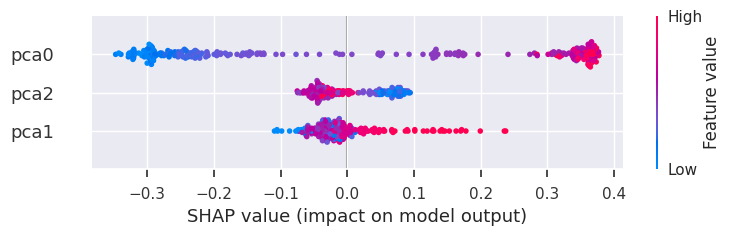

In [159]:
interpret_model(tuned_rf_pca, plot='summary')

In [ ]:
from pycaret.classification import *
initjs()


In [ ]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

In [162]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

In [163]:
interpret_model(tuned_rf_pca, plot='reason')

In [164]:
# Using Explainable AI to explore some of the classifiers in my project
# In my project, Extra Trees Classifier (et) has a good classification perfromance for original data
# In my project, decision tree (dt) has a low classification perfromance after appling PCA to my data
# So, I decided to employ Explainable AI to investigate et and dt classifiers more precisely

clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = False, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 8)"
5,Transformed train set shape,"(630, 8)"
6,Transformed test set shape,"(270, 8)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


In [165]:
etclf = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9546,0.9032,0.8485,0.8750,0.7462,0.7477
1,0.8889,0.9178,0.8710,0.9000,0.8852,0.7776,0.7780
2,0.7778,0.9027,0.8065,0.7576,0.7812,0.5559,0.5570
3,0.8730,0.9108,0.9032,0.8485,0.8750,0.7462,0.7477
4,0.8730,0.9420,0.8065,0.9259,0.8621,0.7455,0.7516
5,0.7619,0.8715,0.6562,0.8400,0.7368,0.5254,0.5387
6,0.7778,0.8760,0.7188,0.8214,0.7667,0.5563,0.5609
7,0.8571,0.9481,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9093,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [166]:
etclf

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [167]:
tuned_etclf = tune_model(etclf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9048,0.9597,0.9032,0.9032,0.9032,0.8095,0.8095
1,0.8730,0.9163,0.8710,0.8710,0.8710,0.7460,0.7460
2,0.8095,0.8952,0.8065,0.8065,0.8065,0.6190,0.6190
3,0.8730,0.9173,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8413,0.9486,0.7742,0.8889,0.8276,0.6818,0.6874
5,0.7937,0.8810,0.6562,0.9130,0.7636,0.5891,0.6145
6,0.8413,0.9183,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8730,0.9506,0.8750,0.8750,0.8750,0.7460,0.7460
8,0.8889,0.9183,0.8438,0.9310,0.8852,0.7781,0.7816


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [168]:
tuned_etclf

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_samples_leaf=6, min_samples_split=9,
                     min_weight_fraction_leaf=0.0, n_estimators=190, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

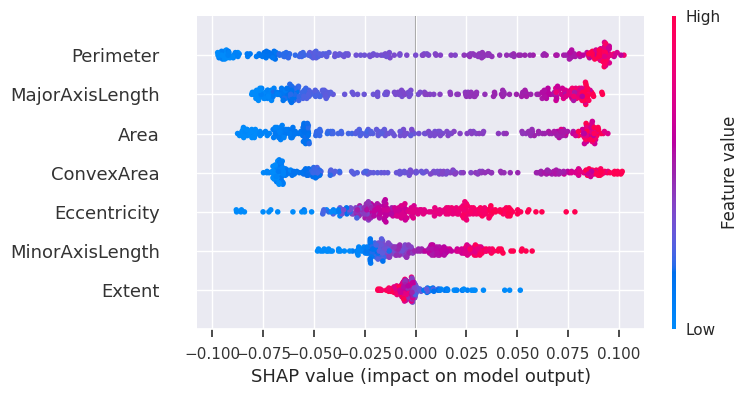

In [169]:
interpret_model(tuned_etclf, plot='summary')

In [170]:
interpret_model(tuned_etclf, plot='reason', observation=32)

In [171]:
interpret_model(tuned_etclf, plot='reason')

In [172]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 4)"
5,Transformed train set shape,"(630, 4)"
6,Transformed test set shape,"(270, 4)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9375,0.9032,0.8235,0.8615,0.7146,0.7179
1,0.8413,0.9042,0.8710,0.8182,0.8438,0.6828,0.6842
2,0.7778,0.8997,0.8065,0.7576,0.7812,0.5559,0.5570
3,0.8730,0.9299,0.9032,0.8485,0.8750,0.7462,0.7477
4,0.8730,0.9441,0.8065,0.9259,0.8621,0.7455,0.7516
5,0.7619,0.8735,0.7188,0.7931,0.7541,0.5244,0.5268
6,0.8254,0.8916,0.7812,0.8621,0.8197,0.6512,0.6542
7,0.8413,0.9309,0.8125,0.8667,0.8387,0.6828,0.6842
8,0.8571,0.9133,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8889,0.9587,0.8710,0.9000,0.8852,0.7776,0.7780
1,0.8889,0.9173,0.9032,0.8750,0.8889,0.7778,0.7782
2,0.7937,0.9052,0.7419,0.8214,0.7797,0.5866,0.5893
3,0.8730,0.9123,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8889,0.9476,0.8387,0.9286,0.8814,0.7774,0.7809
5,0.8095,0.8851,0.6875,0.9167,0.7857,0.6205,0.6413
6,0.8413,0.9234,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.8730,0.9385,0.8750,0.8750,0.8750,0.7460,0.7460
8,0.9048,0.9284,0.8750,0.9333,0.9032,0.8097,0.8113


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

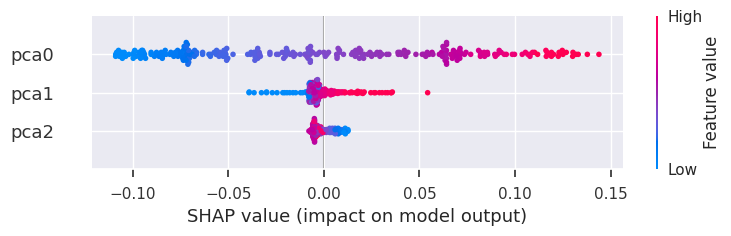

In [173]:
etclf2 = create_model('et')
tuned_etclf2 = tune_model(etclf2)

evaluate_model(tuned_etclf2)
interpret_model(tuned_etclf2, plot='summary')
interpret_model(tuned_etclf2, plot='reason', observation=32)
interpret_model(tuned_etclf2, plot='reason')

In [174]:
interpret_model(tuned_etclf2, plot='reason', observation=32)

In [175]:
svm3pca=create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8413,0.0000,0.8387,0.8387,0.8387,0.6825,0.6825
1,0.9048,0.0000,0.9032,0.9032,0.9032,0.8095,0.8095
2,0.8413,0.0000,0.8710,0.8182,0.8438,0.6828,0.6842
3,0.8571,0.0000,0.8710,0.8438,0.8571,0.7144,0.7147
4,0.8413,0.0000,0.7742,0.8889,0.8276,0.6818,0.6874
5,0.7460,0.0000,0.5312,0.9444,0.6800,0.4955,0.5522
6,0.7619,0.0000,0.9062,0.7073,0.7945,0.5215,0.5444
7,0.8571,0.0000,0.8125,0.8966,0.8525,0.7146,0.7179
8,0.8571,0.0000,0.8125,0.8966,0.8525,0.7146,0.7179


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [176]:
tuned_svm3pca=tune_model(svm3pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8889,0.0000,0.8710,0.9000,0.8852,0.7776,0.7780
1,0.8889,0.0000,0.9355,0.8529,0.8923,0.7781,0.7816
2,0.8413,0.0000,0.8065,0.8621,0.8333,0.6821,0.6835
3,0.8889,0.0000,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8571,0.0000,0.8065,0.8929,0.8475,0.7138,0.7171
5,0.8095,0.0000,0.7188,0.8846,0.7931,0.6201,0.6316
6,0.8413,0.0000,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8571,0.0000,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8730,0.0000,0.8438,0.9000,0.8710,0.7462,0.7477


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [177]:
knn3pca=create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9219,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8571,0.9138,0.8710,0.8438,0.8571,0.7144,0.7147
2,0.7778,0.8438,0.7419,0.7931,0.7667,0.5550,0.5561
3,0.8413,0.9047,0.8710,0.8182,0.8438,0.6828,0.6842
4,0.8730,0.9441,0.8387,0.8966,0.8667,0.7457,0.7472
5,0.7302,0.8493,0.5938,0.8261,0.6909,0.4626,0.4826
6,0.8413,0.8821,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8413,0.9325,0.8125,0.8667,0.8387,0.6828,0.6842
8,0.8730,0.9073,0.8125,0.9286,0.8667,0.7465,0.7525


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [178]:
tuned_knn3pca=tune_model(knn3pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8889,0.9531,0.8710,0.9000,0.8852,0.7776,0.7780
1,0.9048,0.9178,0.8710,0.9310,0.9000,0.8093,0.8109
2,0.8095,0.9047,0.7742,0.8276,0.8000,0.6186,0.6198
3,0.8889,0.9037,0.8710,0.9000,0.8852,0.7776,0.7780
4,0.9206,0.9592,0.8710,0.9643,0.9153,0.8410,0.8448
5,0.7778,0.8684,0.5938,0.9500,0.7308,0.5581,0.6030
6,0.8254,0.9093,0.7812,0.8621,0.8197,0.6512,0.6542
7,0.8413,0.9410,0.7812,0.8929,0.8333,0.6831,0.6887
8,0.8730,0.9350,0.8125,0.9286,0.8667,0.7465,0.7525


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [179]:
lr3pca=create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9516,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8571,0.9244,0.9032,0.8235,0.8615,0.7146,0.7179
2,0.8095,0.9103,0.8065,0.8065,0.8065,0.6190,0.6190
3,0.8571,0.9113,0.8710,0.8438,0.8571,0.7144,0.7147
4,0.8889,0.9496,0.8710,0.9000,0.8852,0.7776,0.7780
5,0.8254,0.8871,0.7188,0.9200,0.8070,0.6519,0.6685
6,0.8571,0.9183,0.8438,0.8710,0.8571,0.7144,0.7147
7,0.8571,0.9304,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9304,0.8125,0.8966,0.8525,0.7146,0.7179


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [180]:
tuned_lr3pca=tune_model(lr3pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9556,0.8710,0.8710,0.8710,0.7460,0.7460
1,0.8571,0.9244,0.9032,0.8235,0.8615,0.7146,0.7179
2,0.8254,0.9093,0.8065,0.8333,0.8197,0.6505,0.6509
3,0.8730,0.9123,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8730,0.9506,0.8387,0.8966,0.8667,0.7457,0.7472
5,0.8254,0.8881,0.7188,0.9200,0.8070,0.6519,0.6685
6,0.8413,0.9194,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.8571,0.9325,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9315,0.8125,0.8966,0.8525,0.7146,0.7179


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [181]:
dtclf = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8254,0.8266,0.9032,0.7778,0.8358,0.6516,0.6599
1,0.7937,0.7933,0.7742,0.8000,0.7869,0.5870,0.5873
2,0.7619,0.7616,0.7419,0.7667,0.7541,0.5234,0.5237
3,0.8254,0.8251,0.8065,0.8333,0.8197,0.6505,0.6509
4,0.8413,0.8402,0.7742,0.8889,0.8276,0.6818,0.6874
5,0.7302,0.7308,0.6875,0.7586,0.7213,0.4610,0.4631
6,0.8413,0.8417,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.7937,0.7939,0.7812,0.8065,0.7937,0.5874,0.5877
8,0.7937,0.7933,0.8125,0.7879,0.8000,0.5870,0.5873


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [182]:
dtclf

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

In [183]:
tuned_dtclf = tune_model(dtclf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9206,0.9209,0.9355,0.9062,0.9206,0.8413,0.8417
1,0.8254,0.8246,0.7742,0.8571,0.8136,0.6502,0.6532
2,0.7619,0.7616,0.7419,0.7667,0.7541,0.5234,0.5237
3,0.8571,0.8569,0.8387,0.8667,0.8525,0.7141,0.7144
4,0.8413,0.8407,0.8065,0.8621,0.8333,0.6821,0.6835
5,0.8095,0.8115,0.6875,0.9167,0.7857,0.6205,0.6413
6,0.7937,0.7944,0.7500,0.8276,0.7869,0.5878,0.5905
7,0.8254,0.8251,0.8438,0.8182,0.8308,0.6505,0.6509
8,0.8571,0.8569,0.8750,0.8485,0.8615,0.7141,0.7144


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [184]:
tuned_dtclf

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=1, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.01, min_samples_leaf=6,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

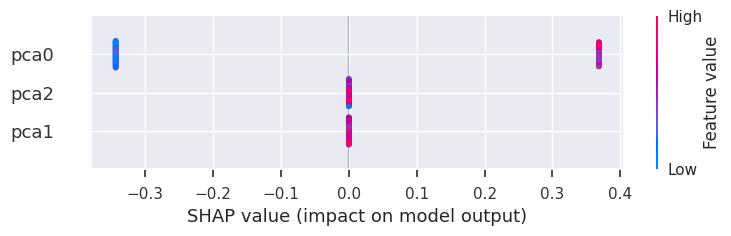

In [185]:
interpret_model(tuned_dtclf, plot='summary')

In [186]:
interpret_model(tuned_dtclf, plot='reason', observation=32)

In [187]:
interpret_model(tuned_dtclf, plot='reason')

In [188]:
# Here, I wanted to see if I use just the 2 first principal components what would be the classification results
# Here, I just chose 2 principal components to see the effects of principla components on classiifcation performances
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 3)"
5,Transformed train set shape,"(630, 3)"
6,Transformed test set shape,"(270, 3)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


In [189]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8698,0.9325,0.8636,0.8750,0.8683,0.7398,0.7414,0.0700
svm,SVM - Linear Kernel,0.8667,0.0000,0.8413,0.8872,0.8615,0.7334,0.7373,0.0380
gbc,Gradient Boosting Classifier,0.8651,0.9244,0.8512,0.8763,0.8615,0.7304,0.7337,0.1380
ridge,Ridge Classifier,0.8635,0.0000,0.7976,0.9207,0.8513,0.7273,0.7371,0.0390
lda,Linear Discriminant Analysis,0.8635,0.9337,0.7976,0.9207,0.8513,0.7273,0.7371,0.0410
lightgbm,Light Gradient Boosting Machine,0.8556,0.9139,0.8322,0.8738,0.8508,0.7114,0.7144,0.1650
rf,Random Forest Classifier,0.8524,0.9161,0.8286,0.8708,0.8477,0.7049,0.7078,0.2400
qda,Quadratic Discriminant Analysis,0.8476,0.9257,0.7656,0.9160,0.8316,0.6955,0.7070,0.0410
ada,Ada Boost Classifier,0.8460,0.9144,0.8161,0.8689,0.8386,0.6922,0.6973,0.1310
knn,K Neighbors Classifier,0.8444,0.9026,0.8351,0.8524,0.8424,0.6891,0.6911,0.0940


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [190]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [191]:
tuned_best_model_pca

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [192]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [193]:
lr2pca=create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.9577,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8730,0.9274,0.9355,0.8286,0.8788,0.7465,0.7525
2,0.8254,0.9062,0.8065,0.8333,0.8197,0.6505,0.6509
3,0.8889,0.9123,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8730,0.9486,0.8387,0.8966,0.8667,0.7457,0.7472
5,0.8413,0.8901,0.7812,0.8929,0.8333,0.6831,0.6887
6,0.8413,0.9173,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.8571,0.9345,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8889,0.9325,0.8750,0.9032,0.8889,0.7778,0.7782


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [194]:
tuned_lr2pca=tune_model(lr2pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9587,0.8710,0.8710,0.8710,0.7460,0.7460
1,0.8730,0.9274,0.9355,0.8286,0.8788,0.7465,0.7525
2,0.8413,0.9042,0.8065,0.8621,0.8333,0.6821,0.6835
3,0.8889,0.9133,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8571,0.9486,0.8065,0.8929,0.8475,0.7138,0.7171
5,0.8413,0.8861,0.7812,0.8929,0.8333,0.6831,0.6887
6,0.8571,0.9153,0.8125,0.8966,0.8525,0.7146,0.7179
7,0.8571,0.9395,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8889,0.9274,0.8750,0.9032,0.8889,0.7778,0.7782


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [195]:
et2pca=create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8254,0.9325,0.8710,0.7941,0.8308,0.6512,0.6542
1,0.8413,0.9264,0.9032,0.8000,0.8485,0.6831,0.6887
2,0.7937,0.8674,0.8387,0.7647,0.8000,0.5878,0.5905
3,0.8571,0.9274,0.8710,0.8438,0.8571,0.7144,0.7147
4,0.8413,0.9113,0.8065,0.8621,0.8333,0.6821,0.6835
5,0.7460,0.8296,0.6875,0.7857,0.7333,0.4930,0.4970
6,0.7937,0.8649,0.7188,0.8519,0.7797,0.5882,0.5958
7,0.8889,0.9516,0.8438,0.9310,0.8852,0.7781,0.7816
8,0.8889,0.9209,0.8750,0.9032,0.8889,0.7778,0.7782


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [196]:
tuned_et2pca=tune_model(et2pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9206,0.9607,0.9355,0.9062,0.9206,0.8413,0.8417
1,0.8889,0.9244,0.9032,0.8750,0.8889,0.7778,0.7782
2,0.8413,0.8992,0.8065,0.8621,0.8333,0.6821,0.6835
3,0.8730,0.9153,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8730,0.9496,0.8065,0.9259,0.8621,0.7455,0.7516
5,0.7937,0.8881,0.6562,0.9130,0.7636,0.5891,0.6145
6,0.8254,0.9153,0.7500,0.8889,0.8136,0.6516,0.6599
7,0.8730,0.9435,0.8438,0.9000,0.8710,0.7462,0.7477
8,0.8889,0.9244,0.8438,0.9310,0.8852,0.7781,0.7816


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [197]:
knn2pca=create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8413,0.8926,0.8710,0.8182,0.8438,0.6828,0.6842
1,0.8730,0.9385,0.9032,0.8485,0.8750,0.7462,0.7477
2,0.7460,0.8644,0.7742,0.7273,0.7500,0.4924,0.4934
3,0.8413,0.9042,0.8710,0.8182,0.8438,0.6828,0.6842
4,0.8571,0.9123,0.8065,0.8929,0.8475,0.7138,0.7171
5,0.7460,0.8417,0.6875,0.7857,0.7333,0.4930,0.4970
6,0.8254,0.8654,0.7812,0.8621,0.8197,0.6512,0.6542
7,0.8889,0.9284,0.8438,0.9310,0.8852,0.7781,0.7816
8,0.8571,0.8876,0.8438,0.8710,0.8571,0.7144,0.7147


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [198]:
tuned_knn2pca=tune_model(knn2pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9456,0.8710,0.8710,0.8710,0.7460,0.7460
1,0.9048,0.9199,0.9032,0.9032,0.9032,0.8095,0.8095
2,0.8254,0.9057,0.7742,0.8571,0.8136,0.6502,0.6532
3,0.9048,0.8987,0.9032,0.9032,0.9032,0.8095,0.8095
4,0.8889,0.9561,0.8387,0.9286,0.8814,0.7774,0.7809
5,0.7937,0.8513,0.6875,0.8800,0.7719,0.5886,0.6036
6,0.8571,0.9068,0.8125,0.8966,0.8525,0.7146,0.7179
7,0.8413,0.9380,0.7812,0.8929,0.8333,0.6831,0.6887
8,0.8889,0.9168,0.8438,0.9310,0.8852,0.7781,0.7816


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [199]:
dt2pca=create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8254,0.8261,0.8710,0.7941,0.8308,0.6512,0.6542
1,0.7619,0.7626,0.8065,0.7353,0.7692,0.5244,0.5268
2,0.8254,0.8256,0.8387,0.8125,0.8254,0.6509,0.6512
3,0.8889,0.8886,0.8710,0.9000,0.8852,0.7776,0.7780
4,0.8413,0.8407,0.8065,0.8621,0.8333,0.6821,0.6835
5,0.7143,0.7152,0.6562,0.7500,0.7000,0.4296,0.4331
6,0.8413,0.8422,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8571,0.8579,0.8125,0.8966,0.8525,0.7146,0.7179
8,0.8571,0.8569,0.8750,0.8485,0.8615,0.7141,0.7144


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [200]:
tuned_dt2pca=tune_model(dt2pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9206,0.9209,0.9355,0.9062,0.9206,0.8413,0.8417
1,0.8254,0.8246,0.7742,0.8571,0.8136,0.6502,0.6532
2,0.7619,0.7616,0.7419,0.7667,0.7541,0.5234,0.5237
3,0.8571,0.8569,0.8387,0.8667,0.8525,0.7141,0.7144
4,0.8413,0.8407,0.8065,0.8621,0.8333,0.6821,0.6835
5,0.8095,0.8115,0.6875,0.9167,0.7857,0.6205,0.6413
6,0.7937,0.7944,0.7500,0.8276,0.7869,0.5878,0.5905
7,0.8254,0.8251,0.8438,0.8182,0.8308,0.6505,0.6509
8,0.8571,0.8569,0.8750,0.8485,0.8615,0.7141,0.7144


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [201]:
svm2pca=create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.0000,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8730,0.0000,0.9032,0.8485,0.8750,0.7462,0.7477
2,0.8254,0.0000,0.7742,0.8571,0.8136,0.6502,0.6532
3,0.8889,0.0000,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8571,0.0000,0.7742,0.9231,0.8421,0.7135,0.7227
5,0.8413,0.0000,0.8125,0.8667,0.8387,0.6828,0.6842
6,0.8413,0.0000,0.7812,0.8929,0.8333,0.6831,0.6887
7,0.8730,0.0000,0.8750,0.8750,0.8750,0.7460,0.7460
8,0.8254,0.0000,0.7188,0.9200,0.8070,0.6519,0.6685


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [202]:
tuned_svm2pca=tune_model(svm2pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8571,0.0000,0.8710,0.8438,0.8571,0.7144,0.7147
1,0.8730,0.0000,0.9355,0.8286,0.8788,0.7465,0.7525
2,0.8413,0.0000,0.8065,0.8621,0.8333,0.6821,0.6835
3,0.9048,0.0000,0.9032,0.9032,0.9032,0.8095,0.8095
4,0.8730,0.0000,0.8387,0.8966,0.8667,0.7457,0.7472
5,0.8413,0.0000,0.7500,0.9231,0.8276,0.6834,0.6961
6,0.8413,0.0000,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.8413,0.0000,0.8125,0.8667,0.8387,0.6828,0.6842
8,0.8730,0.0000,0.8438,0.9000,0.8710,0.7462,0.7477


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [203]:
# Install necessary packages if not already installed
# !pip install pandas scikit-learn pycaret

import pandas as pd
from pycaret.classification import *

# Load the dataset
url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Initialize PyCaret setup
clf = setup(data, target='class', session_id=123, train_size=0.7)

# Compare different models
compare_models()

# Create a model
model = create_model('dt')

# Evaluate the model
evaluate_model(model)

# Save the model
save_model(model, 'multiclass_model')

# You can load the model later using:
# loaded_model = load_model('multiclass_model')


,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 8)"
5,Transformed train set shape,"(630, 8)"
6,Transformed test set shape,"(270, 8)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.8667,0.9333,0.7811,0.9418,0.8521,0.7335,0.7456,0.0270
lr,Logistic Regression,0.8651,0.9328,0.8320,0.8901,0.8593,0.7302,0.7327,0.0460
lightgbm,Light Gradient Boosting Machine,0.8651,0.9288,0.8416,0.8829,0.8612,0.7303,0.7318,0.4370
ada,Ada Boost Classifier,0.8571,0.9214,0.8415,0.8701,0.8543,0.7144,0.7165,0.1340
rf,Random Forest Classifier,0.8556,0.9310,0.8260,0.8790,0.8499,0.7114,0.7149,0.4170
gbc,Gradient Boosting Classifier,0.8508,0.9261,0.8226,0.8721,0.8454,0.7017,0.7043,0.1900
xgboost,Extreme Gradient Boosting,0.8508,0.9222,0.8291,0.8673,0.8469,0.7017,0.7036,0.0870
ridge,Ridge Classifier,0.8492,0.0000,0.8350,0.8599,0.8457,0.6986,0.7010,0.0280
lda,Linear Discriminant Analysis,0.8460,0.9308,0.8350,0.8547,0.8431,0.6922,0.6947,0.0260
et,Extra Trees Classifier,0.8460,0.9215,0.8165,0.8704,0.8405,0.6924,0.6966,0.1880


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9048,0.9052,0.9355,0.8788,0.9062,0.8097,0.8113
1,0.8413,0.8422,0.9032,0.8000,0.8485,0.6831,0.6887
2,0.7460,0.7460,0.7419,0.7419,0.7419,0.4919,0.4919
3,0.8254,0.8256,0.8387,0.8125,0.8254,0.6509,0.6512
4,0.8413,0.8412,0.8387,0.8387,0.8387,0.6825,0.6825
5,0.7143,0.7142,0.7188,0.7188,0.7188,0.4284,0.4284
6,0.7619,0.7626,0.7188,0.7931,0.7541,0.5244,0.5268
7,0.7460,0.7450,0.8125,0.7222,0.7647,0.4909,0.4949
8,0.8095,0.8100,0.7812,0.8333,0.8065,0.6193,0.6206


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Area', 'MajorAxisLength',
                                              'MinorAxisLength', 'Eccentricity',
                                              'ConvexArea', 'Extent',
                                              'Perimeter'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_values=nan,
                                                               strategy='mean',
                                                               verbose='deprecat...
           

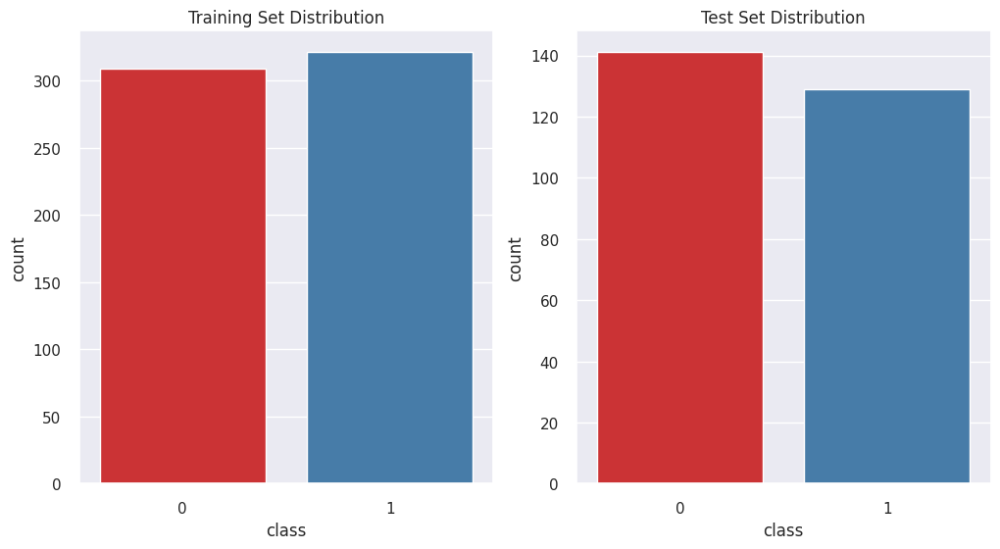

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.90      0.86       141
           1       0.88      0.80      0.84       129

    accuracy                           0.85       270
   macro avg       0.86      0.85      0.85       270
weighted avg       0.85      0.85      0.85       270



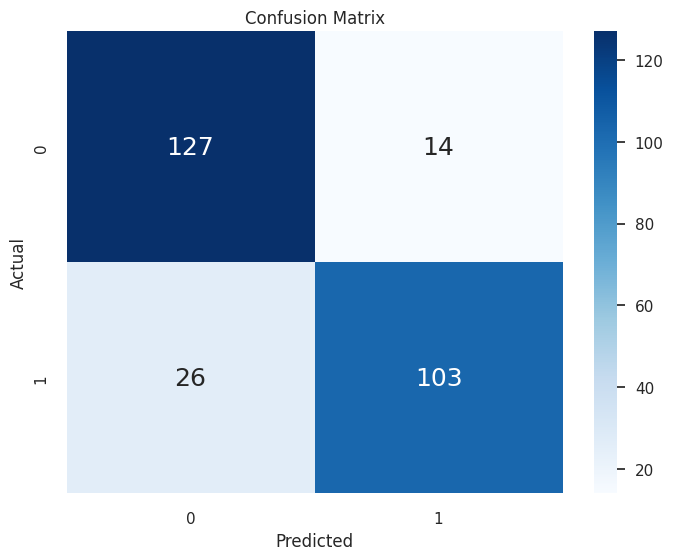

In [204]:
# Install necessary packages if not already installed
# !pip install pandas scikit-learn matplotlib seaborn

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Assume 'class' is the target column
X = data.drop('class', axis=1)
y = data['class']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Plot the distribution of the training and test sets
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.countplot(x=y_train, palette='Set1')
plt.title('Training Set Distribution')

plt.subplot(1, 2, 2)
sns.countplot(x=y_test, palette='Set1')
plt.title('Test Set Distribution')

plt.show()

# Initialize Gaussian Naive Bayes model
gnb = GaussianNB()

# Train the model
gnb.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gnb.predict(X_test)

# Generate classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=data['class'].unique(), yticklabels=data['class'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       141
           1       0.83      0.86      0.85       129

    accuracy                           0.85       270
   macro avg       0.85      0.85      0.85       270
weighted avg       0.85      0.85      0.85       270



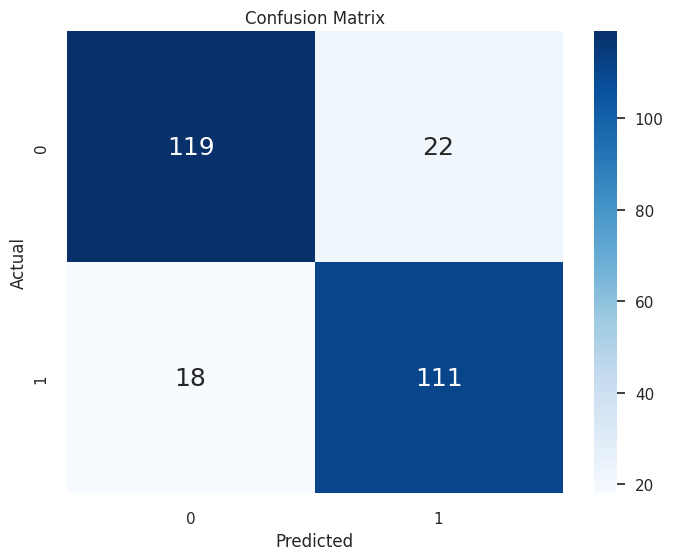

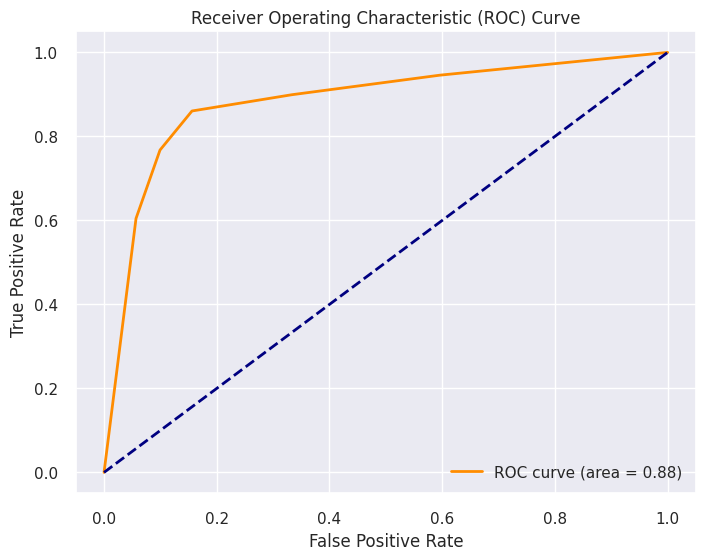

In [205]:
# Install necessary packages if not already installed
# !pip install pandas scikit-learn matplotlib seaborn

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Assume 'class' is the target column
X = data.drop('class', axis=1)
y = data['class']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize K Nearest Neighbors model
knn_classifier = KNeighborsClassifier()

# Train the model
knn_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = knn_classifier.predict(X_test)

# Generate classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=data['class'].unique(), yticklabels=data['class'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Generate ROC curve and AUC
y_probs = knn_classifier.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Plot decision boundary for 2D dataset (assuming first two features)
if X.shape[1] == 2:
    h = .02  # step size in the mesh
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = pd.DataFrame(X.iloc[:, 0]).to_numpy(), pd.DataFrame(X.iloc[:, 1]).to_numpy()
    mesh_x, mesh_y = pd.DataFrame(np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))).to_numpy()

    Z = knn_classifier.predict(np.c_[mesh_x.ravel(), mesh_y.ravel()])
    Z = Z.reshape(mesh_x.shape)

    plt.figure(figsize=(8, 6))
    plt.contourf(mesh_x, mesh_y, Z, cmap=plt.cm.Blues, alpha=0.8)
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolors='k', cmap=plt.cm.Paired)
    plt.title("Decision Boundary")
    plt.xlabel(X.columns[0])
    plt.ylabel(X.columns[1])
    plt.show()


Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.78      0.79       141
           1       0.77      0.79      0.78       129

    accuracy                           0.79       270
   macro avg       0.78      0.79      0.78       270
weighted avg       0.79      0.79      0.79       270



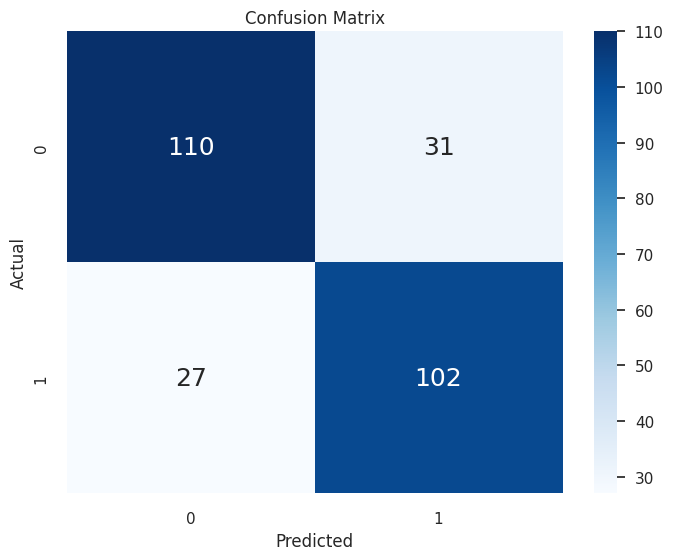

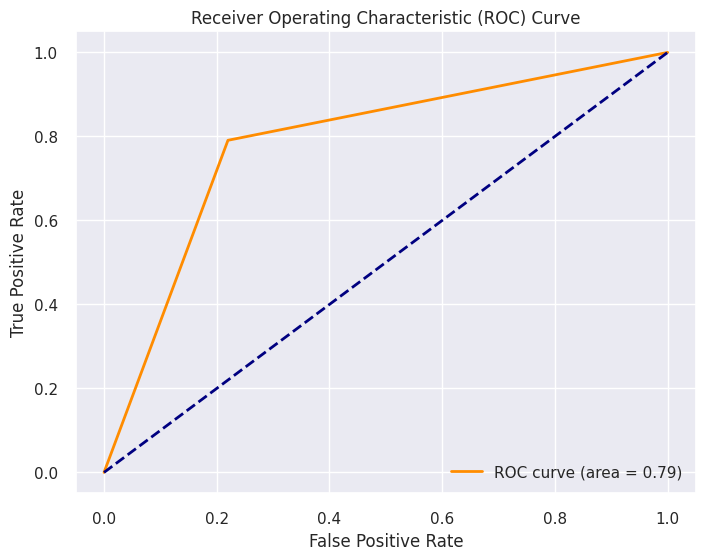

In [206]:
# Install necessary packages if not already installed
# !pip install pandas scikit-learn matplotlib seaborn

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Assume 'class' is the target column
X = data.drop('class', axis=1)
y = data['class']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize Decision Tree model
dt_classifier = DecisionTreeClassifier(random_state=42)

# Train the model
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Generate classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=data['class'].unique(), yticklabels=data['class'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Generate ROC curve and AUC
y_probs = dt_classifier.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Plot decision tree (requires graphviz and pydotplus)
# Uncomment the following lines if you have graphviz and pydotplus installed
# from sklearn.tree import export_graphviz
# from IPython.display import Image
# import pydotplus
#
# dot_data = export_graphviz(dt_classifier, out_file=None,
#                            feature_names=X.columns,
#                            class_names=data['class'].unique(),
#                            filled=True, rounded=True,
#                            special_characters=True)
#
# graph = pydotplus.graph_from_dot_data(dot_data)
# Image(graph.create_png())


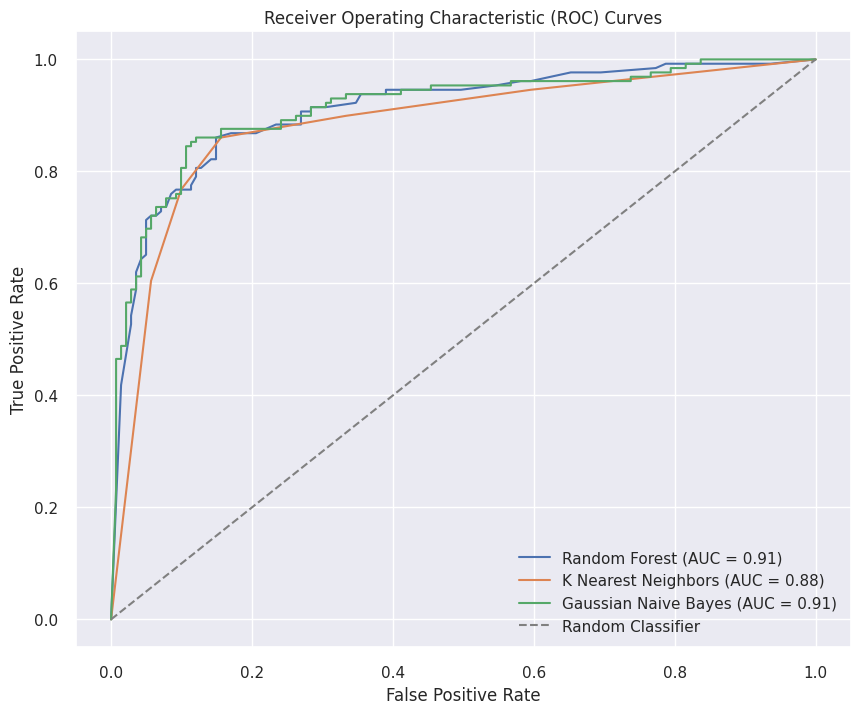


Classification Report for Random Forest:
               precision    recall  f1-score   support

           0       0.87      0.83      0.85       141
           1       0.82      0.87      0.85       129

    accuracy                           0.85       270
   macro avg       0.85      0.85      0.85       270
weighted avg       0.85      0.85      0.85       270



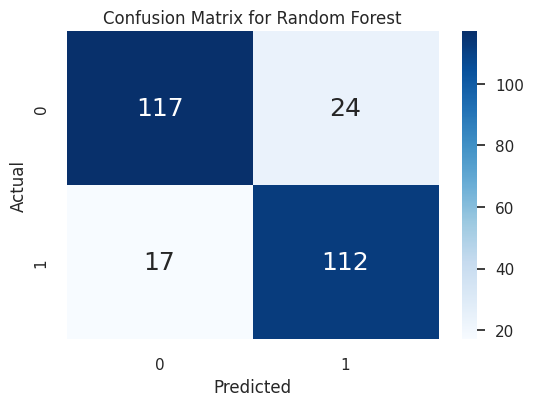


Classification Report for K Nearest Neighbors:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       141
           1       0.83      0.86      0.85       129

    accuracy                           0.85       270
   macro avg       0.85      0.85      0.85       270
weighted avg       0.85      0.85      0.85       270



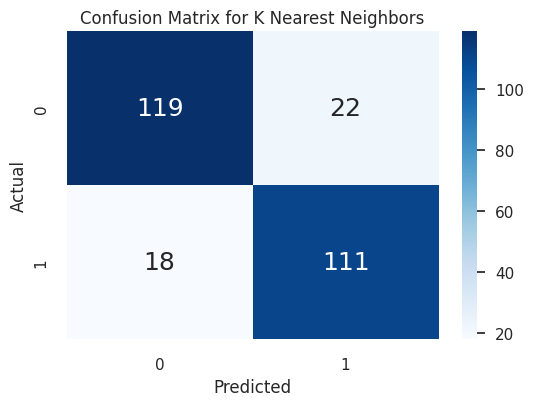


Classification Report for Gaussian Naive Bayes:
               precision    recall  f1-score   support

           0       0.83      0.90      0.86       141
           1       0.88      0.80      0.84       129

    accuracy                           0.85       270
   macro avg       0.86      0.85      0.85       270
weighted avg       0.85      0.85      0.85       270



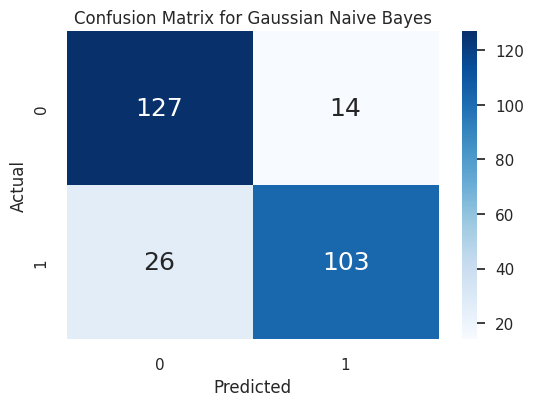

In [207]:
# Install necessary packages if not already installed
# !pip install pandas scikit-learn matplotlib seaborn

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Assume 'class' is the target column
X = data.drop('class', axis=1)
y = data['class']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize classifiers
rf_classifier = RandomForestClassifier(random_state=42)
knn_classifier = KNeighborsClassifier()
gnb_classifier = GaussianNB()

classifiers = {'Random Forest': rf_classifier,
               'K Nearest Neighbors': knn_classifier,
               'Gaussian Naive Bayes': gnb_classifier}

# Plot ROC curves for each classifier
plt.figure(figsize=(10, 8))

for clf_name, clf in classifiers.items():
    # Train the model
    clf.fit(X_train, y_train)

    # Make predictions on the test set
    y_probs = clf.predict_proba(X_test)[:, 1]

    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.plot(fpr, tpr, label=f'{clf_name} (AUC = {roc_auc:.2f})')

# Plot the random classifier for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='grey', label='Random Classifier')

# Customize the plot
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# Generate classification reports and confusion matrices
for clf_name, clf in classifiers.items():
    # Make predictions on the test set
    y_pred = clf.predict(X_test)

    # Generate classification report
    print(f"\nClassification Report for {clf_name}:\n", classification_report(y_test, y_pred))

    # Generate confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=data['class'].unique(),
                yticklabels=data['class'].unique())
    plt.title(f"Confusion Matrix for {clf_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


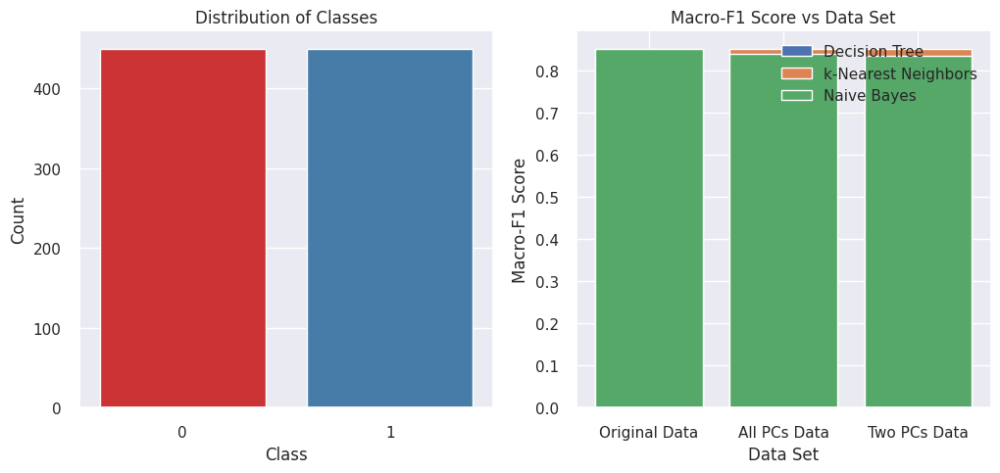

In [208]:
# Install necessary packages if not already installed
# !pip install pandas scikit-learn matplotlib seaborn

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv'
data = pd.read_csv(url)

# Assume 'class' is the target column
target_column = 'class'
X = data.drop(target_column, axis=1)
y = data[target_column]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize classifiers
dt_classifier = DecisionTreeClassifier(random_state=42)
knn_classifier = KNeighborsClassifier()
nb_classifier = GaussianNB()

classifiers = {'Decision Tree': dt_classifier,
               'k-Nearest Neighbors': knn_classifier,
               'Naive Bayes': nb_classifier}

# Function to calculate macro-F1 score
def calculate_macro_f1(X_train, X_test, y_train, y_test, classifier):
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    macro_f1 = f1_score(y_test, y_pred, average='macro')
    return macro_f1

# Calculate macro-F1 scores for original data, all PCs data, and two PCs data
data_sets = ['Original Data', 'All PCs Data', 'Two PCs Data']
macro_f1_scores = {classifier: [] for classifier in classifiers}

for data_set in data_sets:
    if data_set == 'Original Data':
        X_train_set, X_test_set = X_train, X_test
    elif data_set == 'All PCs Data':
        pca = PCA(n_components=X.shape[1])
        X_train_set = pca.fit_transform(X_train)
        X_test_set = pca.transform(X_test)
    elif data_set == 'Two PCs Data':
        pca = PCA(n_components=2)
        X_train_set = pca.fit_transform(X_train)
        X_test_set = pca.transform(X_test)

    for classifier_name, classifier in classifiers.items():
        macro_f1 = calculate_macro_f1(X_train_set, X_test_set, y_train, y_test, classifier)
        macro_f1_scores[classifier_name].append(macro_f1)

# Plot bar chart for distribution of 'class' column
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.countplot(x='class', data=data, palette='Set1')
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')

# Plot bar chart for macro-F1 scores
plt.subplot(1, 2, 2)
for classifier_name, scores in macro_f1_scores.items():
    plt.bar(data_sets, scores, label=classifier_name)

plt.title('Macro-F1 Score vs Data Set')
plt.xlabel('Data Set')
plt.ylabel('Macro-F1 Score')
plt.legend()
plt.show()


In [209]:
def enable_colab():
 # Import the PyCaret library
 import pycaret
 pycaret.utils.enable_colab()
 from enable_colab import enable_colab
 enable_colab()



In [210]:
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (7,5)

#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/ZaraJ2023/Concordia-INSE6220-F2023/main/Raisin_Dataset01.csv')
df.head(25)


,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,0
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,0
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,0
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,0
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,0


In [211]:
from pycaret.classification import *
clf_pca = setup(data=df, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(900, 8)"
4,Transformed data shape,"(900, 4)"
5,Transformed train set shape,"(630, 4)"
6,Transformed test set shape,"(270, 4)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


In [212]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8635,0.9310,0.8510,0.8745,0.8610,0.7272,0.7297,0.0430
ridge,Ridge Classifier,0.8587,0.0000,0.7972,0.9099,0.8469,0.7177,0.7259,0.0380
lda,Linear Discriminant Analysis,0.8587,0.9305,0.7972,0.9099,0.8469,0.7177,0.7259,0.0410
gbc,Gradient Boosting Classifier,0.8540,0.9223,0.8290,0.8741,0.8490,0.7082,0.7118,0.1550
rf,Random Forest Classifier,0.8508,0.9181,0.8258,0.8704,0.8462,0.7018,0.7046,0.2450
ada,Ada Boost Classifier,0.8492,0.9117,0.8098,0.8797,0.8414,0.6986,0.7031,0.1350
svm,SVM - Linear Kernel,0.8476,0.0000,0.8321,0.8679,0.8420,0.6954,0.7049,0.0570
nb,Naive Bayes,0.8460,0.9274,0.7623,0.9165,0.8294,0.6923,0.7045,0.0660
xgboost,Extreme Gradient Boosting,0.8460,0.9013,0.8286,0.8598,0.8429,0.6922,0.6942,0.1340
knn,K Neighbors Classifier,0.8429,0.9083,0.8100,0.8676,0.8356,0.6860,0.6900,0.0850


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [213]:
best_model_pca


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [214]:
tuned_best_model_pca = tune_model(best_model_pca)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9556,0.8710,0.8710,0.8710,0.7460,0.7460
1,0.8571,0.9244,0.9032,0.8235,0.8615,0.7146,0.7179
2,0.8254,0.9093,0.8065,0.8333,0.8197,0.6505,0.6509
3,0.8730,0.9123,0.8710,0.8710,0.8710,0.7460,0.7460
4,0.8730,0.9506,0.8387,0.8966,0.8667,0.7457,0.7472
5,0.8254,0.8881,0.7188,0.9200,0.8070,0.6519,0.6685
6,0.8413,0.9194,0.8125,0.8667,0.8387,0.6828,0.6842
7,0.8571,0.9325,0.8438,0.8710,0.8571,0.7144,0.7147
8,0.8571,0.9315,0.8125,0.8966,0.8525,0.7146,0.7179


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [215]:
tuned_best_model_pca


LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [216]:
!pip install --upgrade pip
!pip install --upgrade yellowbrick
!pip install yellowbrick==1.3.post1

!pip install scipy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.8 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.4/271.4 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 32.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of contourpy to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.7/301.7 kB 17.8 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × Building wheel for numpy (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR

In [217]:
# !pip install scipy
evaluate_model(tuned_best_model_pca)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [218]:
rf_pca = create_model('rf')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8730,0.9350,0.9032,0.8485,0.8750,0.7462,0.7477
1,0.8730,0.9133,0.8710,0.8710,0.8710,0.7460,0.7460
2,0.7460,0.8715,0.7419,0.7419,0.7419,0.4919,0.4919
3,0.8889,0.9264,0.9032,0.8750,0.8889,0.7778,0.7782
4,0.8889,0.9491,0.8387,0.9286,0.8814,0.7774,0.7809
5,0.7937,0.8775,0.7188,0.8519,0.7797,0.5882,0.5958
6,0.8254,0.8795,0.7812,0.8621,0.8197,0.6512,0.6542
7,0.8254,0.9259,0.7812,0.8621,0.8197,0.6512,0.6542
8,0.8571,0.9138,0.7812,0.9259,0.8475,0.7149,0.7241


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
tuned_rf_pca = tune_model(rf_pca)


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,04:31:49
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Random Forest Classifier


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
interpret_model(tuned_rf_pca, plot='summary')
